In [109]:
!pip install seaborn


In [110]:
!pip install geopandas

In [111]:
import pandas as pd
import numpy as np
import math
import geopandas as gpd
from shapely.geometry import Point
from matplotlib import pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error, r2_score
from pyproj import CRS

Define all important function here

In [112]:
# Now define the function to classify the site
def site_class (AMI, WWI):
    if WWI <1.0 and AMI>1.5:
        return 'commute'
    elif (WWI<1.0 and AMI<=1.5) or (1.0<WWI<1.8 and AMI>1.5):
        return 'mixed'
    else:
        return 'non_commute'

In [113]:
def group(M_Zone, RSU_Zone, Site_class):
    if M_Zone == 'Mountain':
        if RSU_Zone == 'rural':
            if Site_class == 'commute':
                return 'Mountain_rural_commute_site'
            elif Site_class == 'mixed':
                return 'Mountain_rural_mixed_site'
            elif Site_class == 'non_commute':
                return 'Mountain_rural_non-commute_site'
        elif RSU_Zone == 'urban':
            if Site_class == 'commute':
                return 'Mountain_urban_commute_site'
            elif Site_class == 'mixed':
                return 'Mountain_urban_mixed_site'
            elif Site_class == 'non_commute':
                return 'Mountain_urban_non-commute_site'
        elif RSU_Zone == 'suburban':
            if Site_class == 'commute':
                return 'Mountain_suburban_commute_site'
            elif Site_class == 'mixed':
                return 'Mountain_suburban_mixed_site'
            elif Site_class == 'non_commute':
                return 'Mountain_suburban_non-commute_site'

    elif M_Zone == 'Non-mountain':
        if RSU_Zone == 'rural':
            if Site_class == 'commute':
                return 'Non-mountain_rural_commute_site'
            elif Site_class == 'mixed':
                return 'Non-mountain_rural_mixed_site'
            elif Site_class == 'non_commute':
                return 'Non-mountain_rural_non-commute_site'
        elif RSU_Zone == 'urban':
            if Site_class == 'commute':
                return 'Non-mountain_urban_commute_site'
            elif Site_class == 'mixed':
                return 'Non-mountain_urban_mixed_site'
            elif Site_class == 'non_commute':
                return 'Non-mountain_urban_non-commute_site'
        elif RSU_Zone == 'suburban':
            if Site_class == 'commute':
                return 'Non-mountain_suburban_commute_site'
            elif Site_class == 'mixed':
                return 'Non-mountain_suburban_mixed_site'
            elif Site_class == 'non_commute':
                return 'Non-mountain_suburban_non-commute_site'

    return 'Unknown'

In [114]:
def AASHTO_AADT(cdata):
    """
    Compute Monthly and Annual Average Daily Traffic (MADT and AADT)
    using AASHTO methodology from hourly traffic count data.

    Parameters:
        cdata (pd.DataFrame): DataFrame with traffic count data including columns:
            - 'id', 'site_name', 'year', 'month', 'Day', 'date',
               'counts', 'hour', 'date', 'long_term', 'Site_Group'

    Returns:
        tuple:
            - AADT (pd.DataFrame): Annual Average Daily Traffic per location/year
            - num_deno_MADT (pd.DataFrame): Monthly Average Daily Traffic (MADT)
    """

    # Validate input type
    if not isinstance(cdata, pd.DataFrame):
        raise ValueError("Input must be a pandas DataFrame")

    # Required columns
    required_cols = {
        'id', 'site_name', 'year', 'month', 'Day', 'date',
        'counts', 'hour', 'date', 'long_term', 'Site_Group'
    }
    missing_cols = required_cols - set(cdata.columns)
    if missing_cols:
        raise ValueError(f"Missing columns: {missing_cols}")

    # Ensure 'counts' is numeric
    if not pd.api.types.is_numeric_dtype(cdata['counts']):
        raise ValueError("'counts' column must be numeric")

    # Convert 'Date' to datetime
    cdata['date'] = pd.to_datetime(cdata['date'])

    # Hourly average by weekday
    # (Average for Each Hour of the Weekday.Group the data by location, month, day of week, and hour. 
    #Then take the average count for each of those tiny slices. This tells us: On average, how many vehicles pass each hour on Mondays, Tuesdays, etc.)
    cdata_hourly_ave = (
        cdata.groupby([
            'id', 'site_name', 'Site_Group',
            'year', 'month', 'Day', 'hour'
        ])[['counts']]
        .mean()
        .reset_index()
    )

    # Sum hourly averages to get daily totals (per day-of-week)
    # Generated Daily Total
    # Add All Hours to Get Daily Total (for each weekday)
    cdata_daily_total = (
        cdata_hourly_ave.groupby([
            'id', 'site_name', 'Site_Group',
            'year', 'month', 'Day'
        ])[['counts']]
        .sum()
        .reset_index()
    )

    # Actual daily totals from raw data (to count days)
    # Real Daily Totals (Raw Data)
    cdata_daily = (
        cdata.groupby([
            'id', 'site_name', 'Site_Group',
            'year', 'month', 'Day', 'date'
        ])[['counts']]
        .sum()
        .reset_index()
    )

    # Count number of each weekday in each month
    # Count How Many Mondays, Tuesdays, etc. Per Month
    # real data er basis e sombar, mongolbar etc. ekta mas e koibar asche
    # .size() ---For each group (like "Location A, District 1, Monday, January 2023"), it counts how many rows are in that group.
    cdata_dcount = (
        cdata_daily.groupby([
            'id', 'site_name', 'Site_Group',
            'year', 'month', 'Day'
        ])
        .size()
        .reset_index(name='Wjm')
    )

    # Merge daily totals with weekday counts
    # Generated daily total / mongolbar, sombar really koto din ache ta add korche
    # ['Loc_id', 'District', 'Intersection', 'Site_Group', 'year', 'month', 'Day'] ei column gular basis e merge korche

    cdata_daily_total_wt = pd.merge(
        cdata_daily_total,
        cdata_dcount,
        on=['id', 'site_name', 'Site_Group', 'year', 'month', 'Day'],
        how='inner'
    )

    # Weighted totals
    #  cdata_daily_total_wt er wt_count column e count ar Wjm column ke gun dichi
    # soja bangla sombar e joto count hoiche dhori(200)take sombar ek mase koidin(4) ache ta diye gun dichi

    cdata_daily_total_wt['wt_count'] = cdata_daily_total_wt['counts'] * cdata_daily_total_wt['Wjm']

    # Monthly aggregation
    # ekmase joto gula somnbar, ,mongolbar etc ase tader weighted count particularly jog korchi
    # ebng pore Wjm er name dichi dm
    MADT = (
        cdata_daily_total_wt.groupby([
            'id', 'site_name', 'Site_Group', 'year', 'month'
        ])[['wt_count', 'Wjm']]
        .sum()
        .reset_index()
        .rename(columns={'Wjm': 'dm'})
    )

    # Compute MADT
    MADT['MADT'] = (
        MADT['wt_count'] / MADT['dm']
    ).round(0).astype('int64')

    # Count number of days per year (for AADT denominator)
    # dm er moddhe valid day gula jog hoi, pore ei column er name change kore days_ct ba dayscount rakhchi
    day_count = (
        MADT.groupby([
            'id', 'site_name', 'Site_Group', 'year'
        ])['dm']
        .sum()
        .reset_index()
        .rename(columns={'dm': 'days_Ct'})
    )

    # Annual weighted total (AADT numerator)
    deno_AADT = (
        MADT.groupby([
            'id', 'site_name', 'Site_Group', 'year'
        ])[['wt_count']]
        .sum()
        .reset_index()
    )

    # Merge numerator and denominator
    AADT = pd.merge(
        deno_AADT,
        day_count,
        on=['id', 'site_name', 'Site_Group', 'year'],
        how='inner'
    )

    # Compute AADT
    AADT['AADT'] = (AADT['wt_count'] / AADT['days_Ct']).round(0).astype('int64')

    return AADT, MADT

In [115]:
def calculate_error_metrics(df, obs_col='Observed_AADT', imp_col='Imputed_AADT'):
    """
    Calculate MAPE, APE, RMSE, and R2 between observed and imputed AADT.

    Parameters:
        df (pd.DataFrame): Input DataFrame containing observed and imputed columns
        obs_col (str): Name of the observed values column
        imp_col (str): Name of the imputed values column

    Returns:
        dict: A dictionary with MAPE, RMSE, R2, and a DataFrame with APE added
    """
    # Avoid division by zero for MAPE
    df = df.copy()
    df['APE'] = np.abs((df[obs_col] - df[imp_col]) / df[obs_col]) * 100
    mape = df['APE'].mean()
    
    rmse = mean_squared_error(df[obs_col], df[imp_col], squared=False)
    r2 = r2_score(df[obs_col], df[imp_col])

    return {
        'MAPE': round(mape, 2),
        'RMSE': round(rmse, 2),
        'R2': round(r2, 4),
        'data_with_APE': df
    }

In [116]:
def compute_metrics(group):
    y_true = group['Observed_AADT']
    y_pred = group['Imputed_AADT']
    
    # Skip empty or all-zero observed groups
    if len(y_true) == 0 or (y_true == 0).all():
        return pd.Series({'MAPE': np.nan, 'RMSE': np.nan, 'R2': np.nan})
    
    return pd.Series({
        'MAPE': mean_absolute_percentage_error(y_true, y_pred)*100,
        'RMSE': mean_squared_error(y_true, y_pred, squared=False),
        'R2': r2_score(y_true, y_pred)
    })

In [117]:
# This defines a function called abline which takes two arguments:
# slope: the slope m of the line.
# intercept: the y-intercept c of the line
#  axes = plt.gca()
# plt.gca() means "get current axes" from Matplotlib. It gets the current plotting area so we can access its x-limits.
# axes.get_xlim() gets the current x-axis range (like [xmin, xmax]).np.array(...) converts it into a NumPy array (which allows vectorized math operations).

def abline(slope, intercept):
    """Plot a line from slope and intercept"""
    axes = plt.gca()
    x_vals = np.array(axes.get_xlim())
    y_vals = intercept + slope * x_vals
    plt.plot(x_vals, y_vals, '--')

Task 01: Use metadata to classify the sites to mountain, non mountain rural, urban and suburban

In [118]:
# read the metda data
metadata=pd.read_csv(
    "G:\\OTHERS\\RESEARCH\\MINTU SIR\\WORKING 05\\CLEANED DATA 02\\filtered_big_dataset_with_stratum.csv",
    dtype={12: str, 13: str}
)
# amader sob data e continuous
# Filters the table to keep only the rows where the column 'Count_Type' is equal to "Continuous"
metadata.head()

,Unnamed: 0,date,isoDate,counts,status,id,site_name,channel_name,latitude,longitude,direction,type,installationDate,counter,interval,stratum
0,0,2022-01-01T00:00:00+0000,2022-01-01T00:00:00-0800,0.0,0.0,103000671,BART AT SPIRE,BART at Spire- Bikes IN to Spire,37.79116,-122.45944,1,real,2010-12-23T00:00:00-0800,X0412011792,60,Path
1,1,2022-01-01T01:00:00+0000,2022-01-01T01:00:00-0800,0.0,0.0,103000671,BART AT SPIRE,BART at Spire- Bikes IN to Spire,37.79116,-122.45944,1,real,2010-12-23T00:00:00-0800,X0412011792,60,Path
2,2,2022-01-01T02:00:00+0000,2022-01-01T02:00:00-0800,0.0,0.0,103000671,BART AT SPIRE,BART at Spire- Bikes IN to Spire,37.79116,-122.45944,1,real,2010-12-23T00:00:00-0800,X0412011792,60,Path
3,3,2022-01-01T03:00:00+0000,2022-01-01T03:00:00-0800,0.0,0.0,103000671,BART AT SPIRE,BART at Spire- Bikes IN to Spire,37.79116,-122.45944,1,real,2010-12-23T00:00:00-0800,X0412011792,60,Path
4,4,2022-01-01T04:00:00+0000,2022-01-01T04:00:00-0800,0.0,0.0,103000671,BART AT SPIRE,BART at Spire- Bikes IN to Spire,37.79116,-122.45944,1,real,2010-12-23T00:00:00-0800,X0412011792,60,Path


In [119]:
# Drop the unnamed index column (e.g., "Unnamed: 0" or similar)
metadata = metadata.loc[:, ~metadata.columns.str.contains('^Unnamed')]

In [120]:
metadata.head()

,date,isoDate,counts,status,id,site_name,channel_name,latitude,longitude,direction,type,installationDate,counter,interval,stratum
0,2022-01-01T00:00:00+0000,2022-01-01T00:00:00-0800,0.0,0.0,103000671,BART AT SPIRE,BART at Spire- Bikes IN to Spire,37.79116,-122.45944,1,real,2010-12-23T00:00:00-0800,X0412011792,60,Path
1,2022-01-01T01:00:00+0000,2022-01-01T01:00:00-0800,0.0,0.0,103000671,BART AT SPIRE,BART at Spire- Bikes IN to Spire,37.79116,-122.45944,1,real,2010-12-23T00:00:00-0800,X0412011792,60,Path
2,2022-01-01T02:00:00+0000,2022-01-01T02:00:00-0800,0.0,0.0,103000671,BART AT SPIRE,BART at Spire- Bikes IN to Spire,37.79116,-122.45944,1,real,2010-12-23T00:00:00-0800,X0412011792,60,Path
3,2022-01-01T03:00:00+0000,2022-01-01T03:00:00-0800,0.0,0.0,103000671,BART AT SPIRE,BART at Spire- Bikes IN to Spire,37.79116,-122.45944,1,real,2010-12-23T00:00:00-0800,X0412011792,60,Path
4,2022-01-01T04:00:00+0000,2022-01-01T04:00:00-0800,0.0,0.0,103000671,BART AT SPIRE,BART at Spire- Bikes IN to Spire,37.79116,-122.45944,1,real,2010-12-23T00:00:00-0800,X0412011792,60,Path


In [121]:
!pip install contextily


In [122]:
import contextily as ctx

In [123]:
# narrow down the meta data list
metadata1 = metadata[['id','site_name', 'latitude', 'longitude']].drop_duplicates()
metadata1.head()


,id,site_name,latitude,longitude
0,103000671,BART AT SPIRE,37.791160,-122.459440
8759,104000671,BART AT SPIRE,37.791160,-122.459440
17518,101001127,Broadway Tunnel west of Hyde St Overpass EB (old),37.796165,-122.419490
26277,101002415,Fell Street west of Scott WB (old site),37.774200,-122.436295
35036,102002415,Fell Street west of Scott WB (old site),37.774200,-122.436295


In [124]:
metadata1.shape

(337, 4)

In [125]:
# Convert Latitude and Longitude to Point geometry ebng etake metadata er geometry column er moddhe rakhsi
# latitude and longitude ke point geometry te convert korte shapely.geometry library lagbe
metadata1['geometry'] = metadata1.apply(lambda row: Point(row['longitude'], row['latitude']), axis=1)
# gpd.GeoDataFrame Converts metadata1 from a normal DataFrame to a GeoDataFrame.
# geometry='geometry' tells GeoPandas which column holds spatial data.
# jodi crs koto ta dekhte chai tahole print(metadata1.crs)
# epsg 4326 degree system e hisebe kore latitude longitude .accurate distance or area er jonno eta valo na tai 3310 e convert korche.oonno reason O thakete pare 
metadata1 = gpd.GeoDataFrame(metadata1, geometry='geometry', crs="EPSG:4326")
metadata1_proj = metadata1.to_crs(epsg=3310)
metadata1_proj.head()

,id,site_name,latitude,longitude,geometry
0,103000671,BART AT SPIRE,37.791160,-122.459440,POINT (-216265.953 -22230.133)
8759,104000671,BART AT SPIRE,37.791160,-122.459440,POINT (-216265.953 -22230.133)
17518,101001127,Broadway Tunnel west of Hyde St Overpass EB (old),37.796165,-122.419490,POINT (-212739.601 -21764.313)
26277,101002415,Fell Street west of Scott WB (old site),37.774200,-122.436295,POINT (-214279.637 -24167.446)
35036,102002415,Fell Street west of Scott WB (old site),37.774200,-122.436295,POINT (-214279.637 -24167.446)


In [126]:
metadata1_proj.isnull().sum()

id           0
site_name    0
latitude     0
longitude    0
geometry     0
dtype: int64

In [127]:
# Read the shapefile
mountain_zone = gpd.read_file("G:\\OTHERS\\RESEARCH\\MINTU SIR\\WORKING 05\\DOWOM_Factor_Dev_Materials\\Mountain_non_mountain\\NWFM.shp")
mountain_zone.crs

<Projected CRS: EPSG:3310>
Name: NAD83 / California Albers
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: United States (USA) - California.
- bounds: (-124.45, 32.53, -114.12, 42.01)
Coordinate Operation:
- name: California Albers
- method: Albers Equal Area
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [128]:
# Filter for mountain zones
#Extract only the rows (polygons) that represent the "Northwestern Forested Mountains".
#'NA_L1KEY' is likely a column describing each zone’s classification.
# The value '6 NORTHWESTERN FORESTED MOUNTAINS' identifies this specific region.
mountain_zone = mountain_zone.loc[mountain_zone['NA_L1KEY'] == '6  NORTHWESTERN FORESTED MOUNTAINS']
# Now convert to EPSG:3310
mountain_zone_proj = mountain_zone.to_crs(epsg=3310)
# View or save result
mountain_zone_proj.head()

NA_L1CODE                        NA_L1NAME                            NA_L1KEY     Shape_Leng    Shape_Area                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     

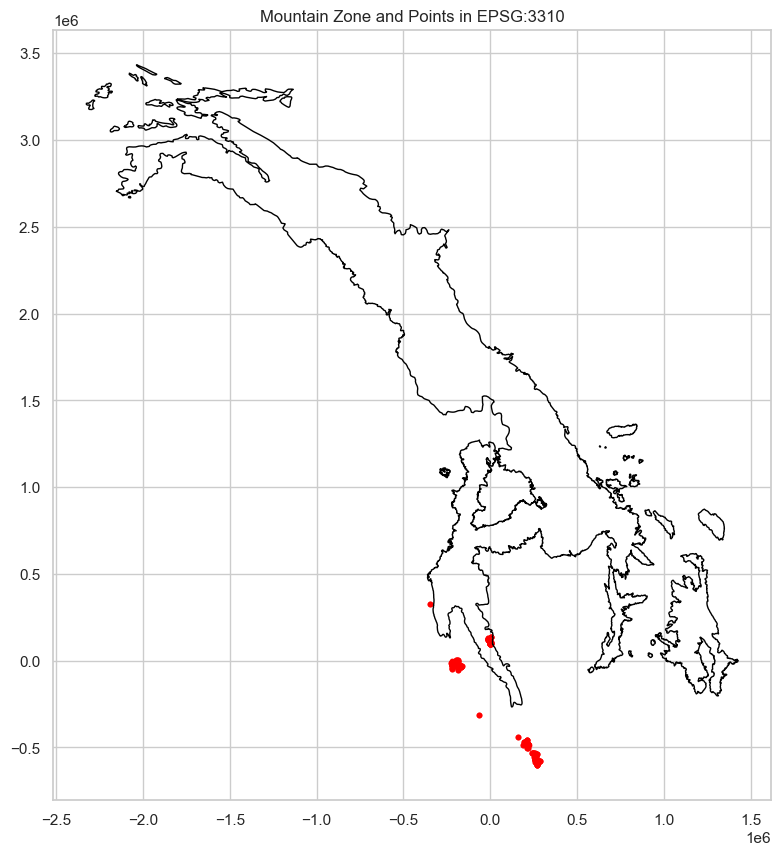

In [129]:
#plot two layers, continous Count only
#plt.subplots() creates a new figure and a set of axes objects where you can plot data. 
# It’s commonly used when you want to create one or more plots in a single figure, either as a single plot or a grid of subplots.
# basic syntax: fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(width, height))
# row =2 , column =2 dile , 1st sarite 2 ta chobi ar 2nd sarite 2 ta chobi thakto
# basically fig, ax chobi akar jonno babohrito hoi
fig, ax = plt.subplots(figsize=(10, 10))
mountain_zone_proj.boundary.plot(ax=ax, color='black', linewidth=1)
metadata1_proj.plot(ax=ax, color='red', markersize=10)
plt.title('Mountain Zone and Points in EPSG:3310')
plt.show()


In [130]:
import geopandas as gpd
# Spatial join: keep only geometry from metadata1, and add info from mountain_zone_proj where matched
# Performs a spatial join between your points (metadata1_proj) and the mountain zone polygon (mountain_zone_proj).
#how='left': Keep all points from metadata1_proj, even if they don’t match the mountain zone.
#[['geometry']]: Only use the geometry of the mountain zone (no other columns are added).
# predicate='intersects': Consider a match if the point intersects the mountain polygon (for points, this typically means it’s inside).
meta_data_with_mnm= gpd.sjoin(metadata1_proj, mountain_zone_proj[['geometry']], how='left', predicate='intersects')

# Assign zone label based on whether the join matched (i.e., if within mountain polygon)
#Checks if a point matched the mountain polygon:If 'index_right' is not null → it's in the mountain.
# If 'index_right' is null (NaN) → it's outside.
#Creates a new column called M_Zone with either:"Mountain" or "Non-mountain"

meta_data_with_mnm['M_Zone'] = meta_data_with_mnm['index_right'].apply(lambda x: 'Mountain' if pd.notnull(x) else 'Non-mountain')
# Removes the 'index_right' column (which was only used internally to track matches)

meta_data_with_mnm=meta_data_with_mnm.drop(['index_right'],axis=1)
meta_data_with_mnm.head()

,id,site_name,latitude,longitude,geometry,M_Zone
0,103000671,BART AT SPIRE,37.791160,-122.459440,POINT (-216265.953 -22230.133),Non-mountain
8759,104000671,BART AT SPIRE,37.791160,-122.459440,POINT (-216265.953 -22230.133),Non-mountain
17518,101001127,Broadway Tunnel west of Hyde St Overpass EB (old),37.796165,-122.419490,POINT (-212739.601 -21764.313),Non-mountain
26277,101002415,Fell Street west of Scott WB (old site),37.774200,-122.436295,POINT (-214279.637 -24167.446),Non-mountain
35036,102002415,Fell Street west of Scott WB (old site),37.774200,-122.436295,POINT (-214279.637 -24167.446),Non-mountain


In [131]:
meta_data_with_mnm.groupby(['M_Zone'])['M_Zone'].count()

M_Zone
Mountain         38
Non-mountain    299
Name: M_Zone, dtype: int64

In [132]:
# Assign mountain/non-mountain zones
# metadata1['M_Zone'] = np.where(metadata1['County'].isin(['Placer', 'El Dorado']), 'Mountain', 'Non-mountain')
# # Create geometry from longitude and latitude
# geometry = [Point(xy) for xy in zip(metadata1["Longitude"], metadata1["Latitude"])]
# # Create GeoDataFrame
# meta_gdf = gpd.GeoDataFrame(metadata1, geometry=geometry, crs="EPSG:4326")
# # Reproject to California Albers (EPSG:3310)
# meta_gdf_prj = meta_gdf.to_crs(epsg=3310)
# # Show result
# meta_gdf_prj.head()

In [133]:
# Read urban, rural and suburban shapefile
ub = gpd.read_file("G:\\OTHERS\\RESEARCH\\MINTU SIR\\WORKING 05\\DOWOM_Factor_Dev_Materials\\Urban_Boundary\\CA_2010_adjusted_urban_area.shp")
ub.head()


UA_2  FID_1 UACE10 GEOID10                           NAME10                                      NAMELSAD10 LSAD10 MTFCC10 UATYP10 FUNCSTAT10    ALAND10  AWATER10   INTPTLAT10    INTPTLON10                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   

In [134]:
# Set CRS (assuming it should be WGS 84)
ub.set_crs(epsg=4269, inplace=True)
# Project to EPSG:3310 (California Albers)
ub_gdf_prj = ub.to_crs(epsg=3310)
# Removes descriptive or metadata columns that are not needed for the analysis.
ub_gdf_prj=ub_gdf_prj.drop(['UA_2', 'FID_1', 'UACE10', 'GEOID10', 'NAME10', 'NAMELSAD10', 'LSAD10','MTFCC10','ALAND10', 'AWATER10', 'INTPTLAT10','INTPTLON10'],axis=1)
ub_gdf_prj.head()

UATYP10 FUNCSTAT10                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              

In [135]:
# join with urban, rural and suburban shape file
# intersects is not a column, It comes from Shapely, the geometry library behind GeoPandas.
# intersects---	Any part of the geometries touch or overlap, within---One geometry is entirely inside the other,contains---One geometry fully contains the other
# meta_data_with_mnm (points, e.g., traffic counters) and with ub_gdf_prj (urban boundary polygons)
# predicate="intersects" checks: “Does this point fall within or touch any urban polygon?”

strata = gpd.sjoin(meta_data_with_mnm, ub_gdf_prj, how="left", predicate="intersects") 
# assign the rural, urban and suburban tag
# UATYP10 is likely a column in the urban boundary shapefile that encodes urban area types: U' → Urban, 'C' → Suburban, (Missing/NaN) → Rural
# The map() function converts codes to meaningful labels: 'C' → 'suburban', 'U' → 'urban'
# fillna('rural') assigns 'rural' to points that didn’t match any polygon, i.e., points outside urban boundaries.

strata['RSU_Zone'] = strata['UATYP10'].map({'C': 'suburban', 'U': 'urban'}).fillna('rural')
strata.head()

,id,site_name,latitude,longitude,geometry,M_Zone,index_right,UATYP10,FUNCSTAT10,RSU_Zone
0,103000671,BART AT SPIRE,37.791160,-122.459440,POINT (-216265.953 -22230.133),Non-mountain,122.0,U,S,urban
8759,104000671,BART AT SPIRE,37.791160,-122.459440,POINT (-216265.953 -22230.133),Non-mountain,122.0,U,S,urban
17518,101001127,Broadway Tunnel west of Hyde St Overpass EB (old),37.796165,-122.419490,POINT (-212739.601 -21764.313),Non-mountain,122.0,U,S,urban
26277,101002415,Fell Street west of Scott WB (old site),37.774200,-122.436295,POINT (-214279.637 -24167.446),Non-mountain,122.0,U,S,urban
35036,102002415,Fell Street west of Scott WB (old site),37.774200,-122.436295,POINT (-214279.637 -24167.446),Non-mountain,122.0,U,S,urban


In [136]:
strata.groupby(['M_Zone'])['M_Zone'].count()

M_Zone
Mountain         38
Non-mountain    299
Name: M_Zone, dtype: int64

Task 02: Clean the count data

In [137]:
# read the hourly count data
hourly_count_raw_data= metadata
# Calculates the number of unique location IDs using .nunique()
# These are the distinct sites where data was collected.

print("The data have " + f"{hourly_count_raw_data['id'].nunique()}" + " unique count site IDs.")
print("The data have " + f"{hourly_count_raw_data['site_name'].nunique()}" + " unique count site names.")

# Prints the total number of rows =total hours of data in the dataset.
# Each row likely represents 1 hour of bike count data at 1 location.

print("The data have " + f"{len(hourly_count_raw_data)}" + " hours of counts.")
# Groups the data by 'Intersection'/ For each group, calculates how many unique Loc_ids are associated with that intersection.
# Sorts the result in descending order → intersections with the most unique locations first/ Shows the top 10.
# To find which intersections have the most sensors or measurement points (i.e., busiest or most complex sites).
hourly_count_raw_data.groupby('site_name').aggregate({'id': 'nunique'}).sort_values('id', ascending=False).head(10)

The data have 337 unique count site IDs.
The data have 198 unique count site names.
The data have 2951783 hours of counts.


,id
site_name,
Sloat Blvd west of 24th Ave WB,7
(24) Marina Bike Path East of Baker St.,6
ACTC4_Emeryville_Greenway,5
Alamo Canal Trail - 580 Undercrossing,4
(31) Panhandle Bike Path Between Masonic & Ashbury,4
(23) Market St. Totem WB between 9th & 10th,4
Iron Horse Trail - Owens Drive,4
Iron Horse Trail - W. Las Positas,4
(32) Polk St. Between Sutter & Post,4


In [138]:
metadata2 = metadata
metadata2.head()

,date,isoDate,counts,status,id,site_name,channel_name,latitude,longitude,direction,type,installationDate,counter,interval,stratum
0,2022-01-01T00:00:00+0000,2022-01-01T00:00:00-0800,0.0,0.0,103000671,BART AT SPIRE,BART at Spire- Bikes IN to Spire,37.79116,-122.45944,1,real,2010-12-23T00:00:00-0800,X0412011792,60,Path
1,2022-01-01T01:00:00+0000,2022-01-01T01:00:00-0800,0.0,0.0,103000671,BART AT SPIRE,BART at Spire- Bikes IN to Spire,37.79116,-122.45944,1,real,2010-12-23T00:00:00-0800,X0412011792,60,Path
2,2022-01-01T02:00:00+0000,2022-01-01T02:00:00-0800,0.0,0.0,103000671,BART AT SPIRE,BART at Spire- Bikes IN to Spire,37.79116,-122.45944,1,real,2010-12-23T00:00:00-0800,X0412011792,60,Path
3,2022-01-01T03:00:00+0000,2022-01-01T03:00:00-0800,0.0,0.0,103000671,BART AT SPIRE,BART at Spire- Bikes IN to Spire,37.79116,-122.45944,1,real,2010-12-23T00:00:00-0800,X0412011792,60,Path
4,2022-01-01T04:00:00+0000,2022-01-01T04:00:00-0800,0.0,0.0,103000671,BART AT SPIRE,BART at Spire- Bikes IN to Spire,37.79116,-122.45944,1,real,2010-12-23T00:00:00-0800,X0412011792,60,Path


In [139]:
# Convert 'date' column to datetime
metadata2['date'] = pd.to_datetime(metadata2['date'])

In [140]:
# Create new columns
metadata2['Year'] = metadata2['date'].dt.year
metadata2['Month'] = metadata2['date'].dt.month_name()        # January, February, ...
metadata2['Day'] = metadata2['date'].dt.day_name()            # Monday, Tuesday, ...
metadata2['Hour'] = metadata2['date'].dt.hour

In [141]:
# Preview
print(metadata2[['date','Year','Month','Day','Hour']].head())

                       date  Year    Month       Day  Hour
0 2022-01-01 00:00:00+00:00  2022  January  Saturday     0
1 2022-01-01 01:00:00+00:00  2022  January  Saturday     1
2 2022-01-01 02:00:00+00:00  2022  January  Saturday     2
3 2022-01-01 03:00:00+00:00  2022  January  Saturday     3
4 2022-01-01 04:00:00+00:00  2022  January  Saturday     4


In [142]:
# drop the unnecessary data
hourly_count_raw_data1=metadata2.drop(['Hour'],axis=1)
# combined the directional flow to total intersection count
# basically Combines directional bike counts into total intersection counts per hour.

hourly_total_count_raw_per_site=hourly_count_raw_data1.groupby(['id', 'site_name', 'Year', 'Month','Day',
       'date'])['counts'].sum().reset_index()
hourly_total_count_raw_per_site['date'] = pd.to_datetime(hourly_total_count_raw_per_site['date'])
hourly_total_count_raw_per_site['hour'] = hourly_total_count_raw_per_site['date'].dt.hour
hourly_total_count_raw_per_site=hourly_total_count_raw_per_site.rename(columns={'Year':'year','Month':'month'})
hourly_total_count_raw_per_site['Date'] = hourly_total_count_raw_per_site['date'].apply(lambda x: (x.date()))
hourly_total_count_raw_per_site.head()

,id,site_name,year,month,Day,date,counts,hour,Date
0,100003832,Escondido Inland Rail Trail EB & WB - Bike,2022,April,Friday,2022-04-01 00:00:00+00:00,0.0,0,2022-04-01
1,100003832,Escondido Inland Rail Trail EB & WB - Bike,2022,April,Friday,2022-04-01 01:00:00+00:00,0.0,1,2022-04-01
2,100003832,Escondido Inland Rail Trail EB & WB - Bike,2022,April,Friday,2022-04-01 02:00:00+00:00,0.0,2,2022-04-01
3,100003832,Escondido Inland Rail Trail EB & WB - Bike,2022,April,Friday,2022-04-01 03:00:00+00:00,0.0,3,2022-04-01
4,100003832,Escondido Inland Rail Trail EB & WB - Bike,2022,April,Friday,2022-04-01 04:00:00+00:00,0.0,4,2022-04-01


In [143]:
# consecutive zeros check out
# The filter() function keeps only those groups where the sum of the 'Count' column is 0, meaning
# For that location & intersection in that month, there were no bikes recorded at all (i.e., all hourly counts were zero).
# This helps find problematic sensors or inactive locations for entire months.
consecutive_zeros_bike_data = hourly_total_count_raw_per_site.groupby(['id', 'site_name', 'year', 'month']).filter(lambda x: (x['counts'].sum() == 0))
print("The data have " + f"{len(consecutive_zeros_bike_data)}" + " hours of counts where the sum for the entire month is 0.")
# Further aggregates the zero-month data:month_count_sum: Sum of counts in the month (will be 0 because of previous filter, but still useful to track).
# num_counts_in_month: How many hourly records were in that month (should be close to 24 * number of days if all data are present).
aggregated_data = consecutive_zeros_bike_data.groupby(['id', 'site_name', 'year', 'month']).agg(
    month_count_sum=('counts', 'sum'),
    num_counts_in_month=('counts', 'count')
).reset_index()

The data have 1946221 hours of counts where the sum for the entire month is 0.


In [144]:
# Filter out rows from bad sites or where month sum is = 0
# .filter(lambda x: x['Count'].sum() > 0)//Keeps only those groups (i.e., location+intersection+month combinations) where the total monthly bike count is greater than 0.
hourly_total_count_clean_per_site = hourly_total_count_raw_per_site.groupby(['id', 'site_name', 'year', 'month']).filter(
    lambda x: (x['counts'].sum() > 0))
print("After removing months where the sum for the entire month of available data was 0, the data have " + f"{hourly_total_count_raw_per_site['id'].nunique()}" + " unique count site IDs.")
print("After removing months where the sum for the entire month of available data was 0, the data have " + f"{hourly_total_count_raw_per_site['site_name'].nunique()}" + " unique count site names.")

After removing months where the sum for the entire month of available data was 0, the data have 337 unique count site IDs.
After removing months where the sum for the entire month of available data was 0, the data have 198 unique count site names.


In [145]:
# Step 1: Sort by time to ensure proper ordering for shift
# Sorts the data by location and time, so that hourly records are in chronological order.
# This is important because you’ll compare each hour’s count with the previous one (shift(1) in the next step depends on order).
hourly_total_count_clean_per_site.sort_values(
    by=['id', 'site_name', 'year', 'month', 'Day', 'date', 'hour'],
    inplace=True
)

# Step 2: Calculate previous hour's count
# For each location and intersection, adds a new column 'prev_hour_count' that contains the bike count from the previous hour.
# The shift(1) function moves values down by 1 row (within each group), so each row can now compare its current Count with the one from the hour before.

hourly_total_count_clean_per_site['prev_hour_count'] = (
    hourly_total_count_clean_per_site
    .groupby(['id', 'site_name'])
    ['counts']
    .shift(1)
)

# Step 3: Flag large increases (>= 30x) from previous hour (if prev count > 15)
# The column flag is a Boolean indicator — it marks whether a row (i.e., an hourly observation) is considered suspicious or abnormal.
# It contains either:True → If the current count is abnormally large (10× or more than the previous hour's count and the previous count is > 10).
# False → If the count increase is not suspicious.
hourly_total_count_clean_per_site['flag'] = (
    (hourly_total_count_clean_per_site['counts'] >= 10 * hourly_total_count_clean_per_site['prev_hour_count']) &
    (hourly_total_count_clean_per_site['prev_hour_count'] > 10)
)

# Step 4: Separate flagged and unflagged rows
flagged_rows4 = hourly_total_count_clean_per_site[hourly_total_count_clean_per_site['flag']]
hourly_total_count_clean_per_site_flagged = hourly_total_count_clean_per_site[~hourly_total_count_clean_per_site['flag']]

# Optional: Display flagged anomalies
flagged_rows4.head()

,id,site_name,year,month,Day,date,counts,hour,Date,prev_hour_count,flag
605835,101018373,(14) Duboce Bike Path behind Safeway,2022,December,Friday,2022-12-02 00:00:00+00:00,3945.0,0,2022-12-02,13.0,True
1072111,101044161,(18) Fell St. Between Scott & Divisadero,2022,January,Tuesday,2022-01-25 10:00:00+00:00,762.0,10,2022-01-25,75.0,True
1088370,101047049,Lakeside-Harrison Cycle Track,2022,February,Friday,2022-02-11 23:00:00+00:00,176.0,23,2022-02-11,12.0,True
1093458,101047049,Lakeside-Harrison Cycle Track,2022,October,Friday,2022-10-14 23:00:00+00:00,287.0,23,2022-10-14,16.0,True
1355554,102018373,(14) Duboce Bike Path behind Safeway,2022,November,Friday,2022-11-25 21:00:00+00:00,650.0,21,2022-11-25,15.0,True


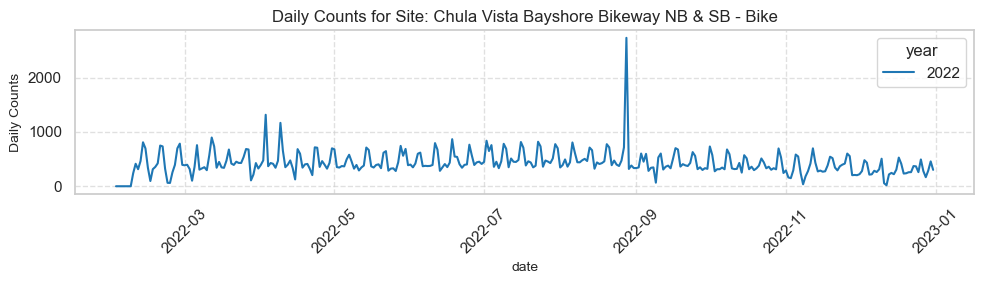

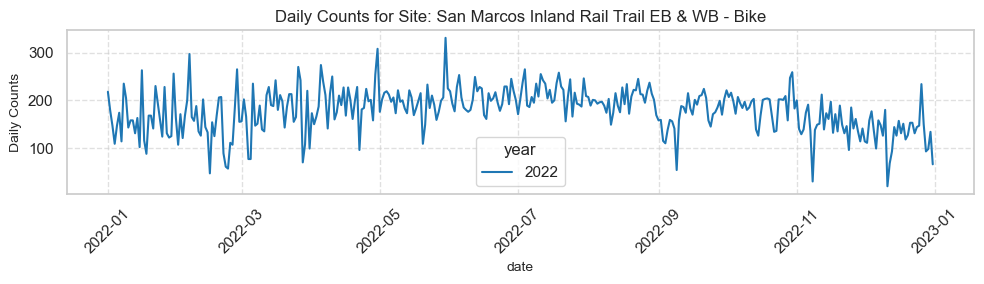

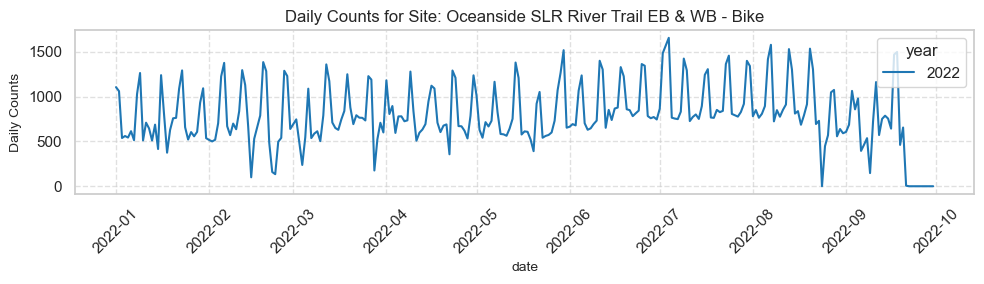

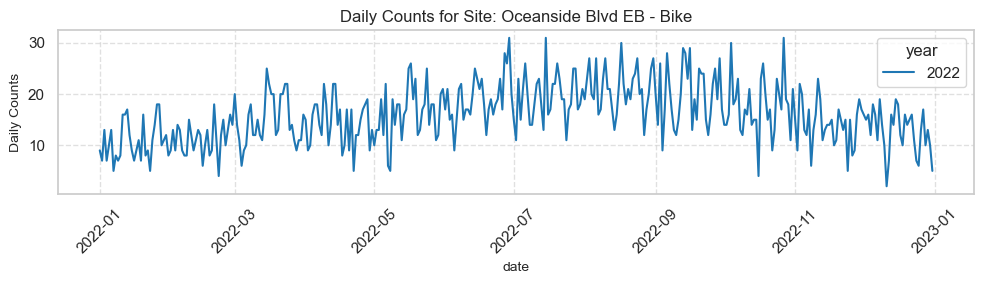

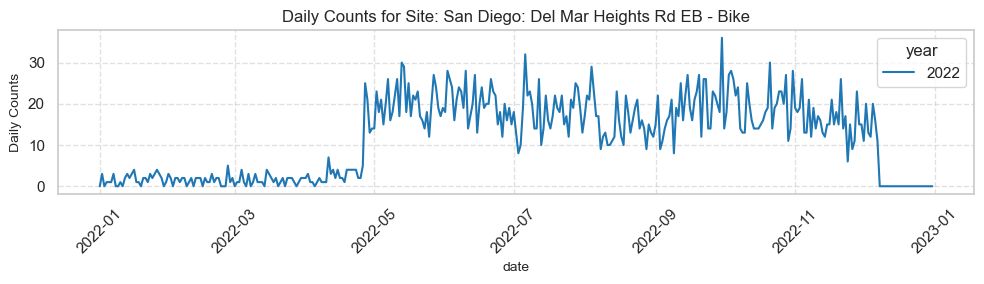

...

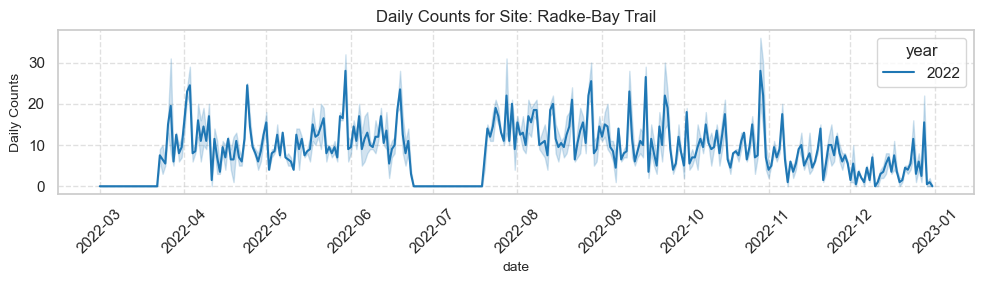

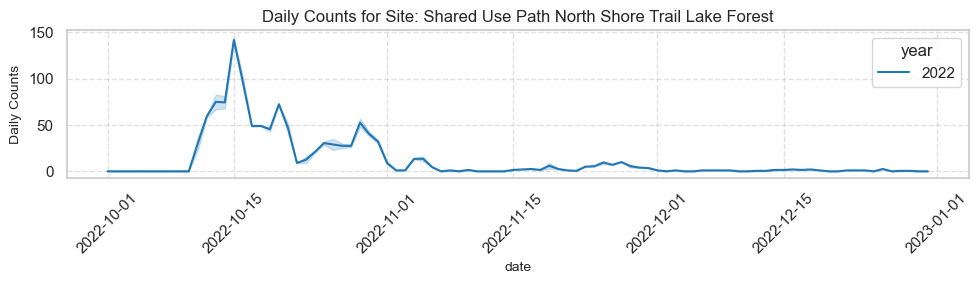

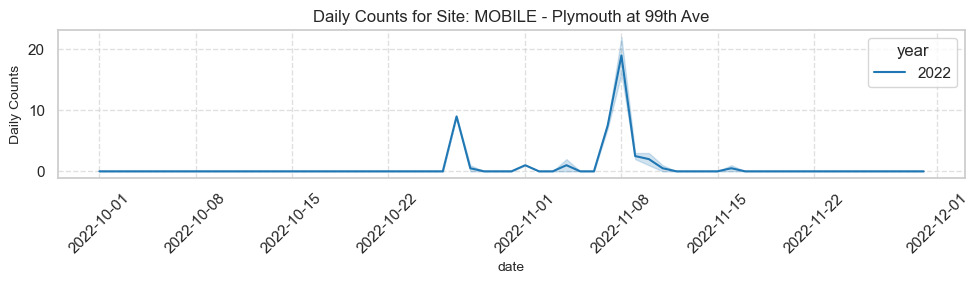

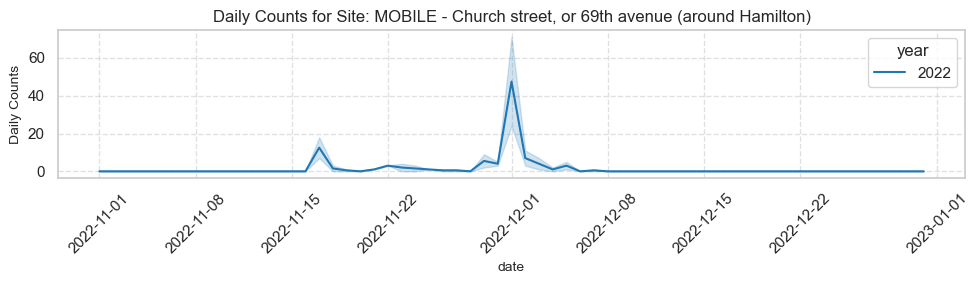

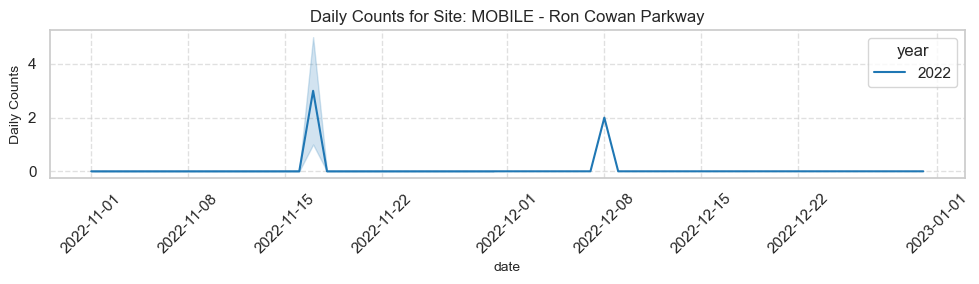

In [146]:
# Graph daily counts
graphing_data = hourly_total_count_clean_per_site_flagged.groupby(['id', 'site_name', 'year','Date']).agg({'counts': 'sum'}).reset_index()
unique_sites = graphing_data['site_name'].unique()

# Create a line graph for each site
for site in unique_sites:
    site_data = graphing_data[graphing_data['site_name'] == site]
    
    plt.figure(figsize=(10, 3))
    sns.lineplot(data=site_data, x='Date', y='counts', hue='year', palette='tab10')
    
    plt.title(f"Daily Counts for Site: {site}", fontsize=12)
    plt.xlabel("date", fontsize=10)
    plt.ylabel("Daily Counts", fontsize=10)
    plt.xticks(rotation=45)
    plt.grid(visible=True, linestyle='--', alpha=0.6)
    
    plt.tight_layout()
    plt.show()

In [147]:
# Delete bad sites
delete_sites = [""]
#delete_sites = ["Route 63 and Midvalley"]

# Filter out bad sites
hourly_total_count_clean_per_site1 = hourly_total_count_clean_per_site_flagged[~hourly_total_count_clean_per_site_flagged['site_name'].isin(delete_sites)]
print("After removing bad sites (based on visualization and name), the data have " + f"{hourly_total_count_clean_per_site1['id'].nunique()}" + " unique count site IDs.")
print("After removing bad sites (based on visualization and name), the data have " + f"{hourly_total_count_clean_per_site1['site_name'].nunique()}" + " unique count sites.")

After removing bad sites (based on visualization and name), the data have 138 unique count site IDs.
After removing bad sites (based on visualization and name), the data have 79 unique count sites.


In [148]:
hourly_total_count_clean_per_site1.head()

,id,site_name,year,month,Day,date,counts,hour,Date,prev_hour_count,flag
8759,100003882,Chula Vista Bayshore Bikeway NB & SB - Bike,2022,April,Friday,2022-04-01 00:00:00+00:00,1.0,0,2022-04-01,NaN,False
8760,100003882,Chula Vista Bayshore Bikeway NB & SB - Bike,2022,April,Friday,2022-04-01 01:00:00+00:00,1.0,1,2022-04-01,1.0,False
8761,100003882,Chula Vista Bayshore Bikeway NB & SB - Bike,2022,April,Friday,2022-04-01 02:00:00+00:00,1.0,2,2022-04-01,1.0,False
8762,100003882,Chula Vista Bayshore Bikeway NB & SB - Bike,2022,April,Friday,2022-04-01 03:00:00+00:00,0.0,3,2022-04-01,1.0,False
8763,100003882,Chula Vista Bayshore Bikeway NB & SB - Bike,2022,April,Friday,2022-04-01 04:00:00+00:00,1.0,4,2022-04-01,0.0,False


In [149]:
# number of counts in each hour of each day of the week of month of year
counts_per_hour = hourly_total_count_clean_per_site1.groupby(['id', 'site_name', 'year', 'month', 'Day', 'hour'])['counts'].count().reset_index()
counts_per_hour = counts_per_hour.rename(columns={'counts': 'num_counts_per_hour'})
# number of hours with at least one count for each day of week in each month - year 
# need at least 1 count per hour (of DOW of month of year) to count the hour as having data 
at_least_one_count_hours = counts_per_hour[counts_per_hour['num_counts_per_hour'] >= 1].reset_index(drop=True)
n_hours_w_at_least_1_count_by_DOW = at_least_one_count_hours.groupby(['id', 'site_name', 'year', 'month', 'Day']).agg(n_hours_at_least_1_count = ('num_counts_per_hour','count')).reset_index()
# days of week of month with 24 hours of (at least one) count
# need 24 hours of data to count the day as having data
full_24_hour_days = n_hours_w_at_least_1_count_by_DOW[n_hours_w_at_least_1_count_by_DOW['n_hours_at_least_1_count']==24].reset_index(drop=True)
n_days_w_24_hour_count = full_24_hour_days.groupby(['id', 'site_name', 'year', 'month']).agg(n_full_24_hour_days = ('Day','nunique')).reset_index()
# months with 7 days of 24 hours of (at least one) count
# need 7 days of 24 hours of data to count the month as having data
seven_day_months = n_days_w_24_hour_count[n_days_w_24_hour_count['n_full_24_hour_days']==7].reset_index(drop=True)
n_months_w_7_days = seven_day_months.groupby(['id', 'site_name', 'year']).agg(n_7_day_months = ('month','nunique')).reset_index()
#Limit to data with 12 months of 7 days of 24 hours of counts, these are long term site-years
eligible_m_s_y_data = n_months_w_7_days[n_months_w_7_days['n_7_day_months'] == 12].reset_index(drop=True)
eligible_m_s_y_data.head()

,id,site_name,year,n_7_day_months
0,100005839,San Marcos Inland Rail Trail EB & WB - Bike,2022,12
1,101003583,Oceanside Blvd EB - Bike,2022,12
2,101003588,San Diego: Del Mar Heights Rd EB - Bike,2022,12
3,101003589,San Diego: Del Mar Heights Rd WB - Bike,2022,12
4,101005214,(07) 7th Ave. Between Lawton & Kirkham - NB,2022,12


In [150]:
# Merge the DataFrames on 'id', 'site_name', and 'year'
hourly_bike_counts_info = hourly_total_count_clean_per_site1.merge(eligible_m_s_y_data[['id', 'site_name', 'year']], 
                                 on=['id', 'site_name', 'year'], 
                                 how='left', 
                                 indicator=True)

# Create the 'long_term' column based on the merge indicator
hourly_bike_counts_info['long_term'] = hourly_bike_counts_info['_merge'].apply(lambda x: 'long_term' if x == 'both' else 'short_term')

# Drop the merge indicator column
hourly_bike_counts_info = hourly_bike_counts_info.drop(columns=['_merge'])
longterm_hourly_bike_clean = hourly_bike_counts_info[hourly_bike_counts_info['long_term'] == 'long_term'].reset_index(drop=True)
shortterm_hourly_bike_clean = hourly_bike_counts_info[hourly_bike_counts_info['long_term'] == 'short_term'].reset_index(drop=True)

In [151]:
longterm_hourly_bike_clean .shape,shortterm_hourly_bike_clean.shape

((779547, 12), (226009, 12))

Task 03: Classify the count data to commute, non-commute, mixed 


In [152]:
# Calculate morning Peak hour average
# Selects only rows where the day is a weekday (Monday to Friday).
ami_weekday=longterm_hourly_bike_clean[longterm_hourly_bike_clean['Day'].isin(['Monday','Tuesday', 'Wednesday','Thursday','Friday'])]
# Filters ami_weekday to keep only rows where the hour is 7 or 8 AM
morning_peak_hr = ami_weekday[ami_weekday['hour'].isin([7, 8])]
# Calculate Mean Count Per Hour
# Groups by location, district, intersection, year, and hour.Calculates the mean count for each of those combinations.
# Average count at 7 AM.Average count at 8 AM
morning_peak_hr_avg=morning_peak_hr.groupby(['id','site_name','year','hour'])['counts'].mean().reset_index()
# Sums the average counts of 7 AM and 8 AM together, giving total average for the morning peak period (7–8 AM).
morning_peak_hr_avg_sum=morning_peak_hr_avg.groupby(['id','site_name','year'])['counts'].sum().reset_index()
morning_peak_hr_avg_sum=morning_peak_hr_avg_sum.rename(columns={'counts': 'Vh_7_8'})
morning_peak_hr_avg_sum.head()

,id,site_name,year,Vh_7_8
0,100005839,San Marcos Inland Rail Trail EB & WB - Bike,2022,21.253846
1,101003583,Oceanside Blvd EB - Bike,2022,3.030769
2,101003588,San Diego: Del Mar Heights Rd EB - Bike,2022,2.180769
3,101003589,San Diego: Del Mar Heights Rd WB - Bike,2022,1.884615
4,101005214,(07) 7th Ave. Between Lawton & Kirkham - NB,2022,31.353846


In [153]:
# Calculate afternoon Peak hour average
afternoon_peak_hr = ami_weekday[ami_weekday['hour'].isin([11, 12])]
afternoon_peak_hr_avg=afternoon_peak_hr.groupby(['id','site_name','year','hour'])['counts'].mean().reset_index()
afternoon_peak_hr_avg_sum=afternoon_peak_hr_avg.groupby(['id','site_name','year'])['counts'].sum().reset_index()
afternoon_peak_hr_avg_sum=afternoon_peak_hr_avg_sum.rename(columns={'counts': 'Vh_11_12'})
afternoon_peak_hr_avg_sum.head()

,id,site_name,year,Vh_11_12
0,100005839,San Marcos Inland Rail Trail EB & WB - Bike,2022,24.180769
1,101003583,Oceanside Blvd EB - Bike,2022,1.738462
2,101003588,San Diego: Del Mar Heights Rd EB - Bike,2022,1.446154
3,101003589,San Diego: Del Mar Heights Rd WB - Bike,2022,1.930769
4,101005214,(07) 7th Ave. Between Lawton & Kirkham - NB,2022,15.780769


In [154]:
# Merge morning and afternoon peak volume 
ma_peak_vol=pd.merge(morning_peak_hr_avg_sum,afternoon_peak_hr_avg_sum, on=['id','site_name','year'], how='inner')
ma_peak_vol['AMI']=ma_peak_vol['Vh_7_8']/ma_peak_vol['Vh_11_12']
ma_peak_vol

,id,site_name,year,Vh_7_8,Vh_11_12,AMI
0,100005839,San Marcos Inland Rail Trail EB & WB - Bike,2022,21.253846,24.180769,0.878957
1,101003583,Oceanside Blvd EB - Bike,2022,3.030769,1.738462,1.743363
2,101003588,San Diego: Del Mar Heights Rd EB - Bike,2022,2.180769,1.446154,1.507979
3,101003589,San Diego: Del Mar Heights Rd WB - Bike,2022,1.884615,1.930769,0.976096
4,101005214,(07) 7th Ave. Between Lawton & Kirkham - NB,2022,31.353846,15.780769,1.986839
...,...,...,...,...,...,...
84,353260909,Sir Francis Drake Boulevard,2022,5.565385,7.676923,0.724950
85,353260910,Sir Francis Drake Boulevard,2022,3.026923,5.103846,0.593067
86,353291773,"Figueroa between 8th St to 9th St, east side",2022,34.953846,48.476923,0.721041
87,353291774,"Figueroa between 8th St to 9th St, east side",2022,8.103846,13.646154,0.593856


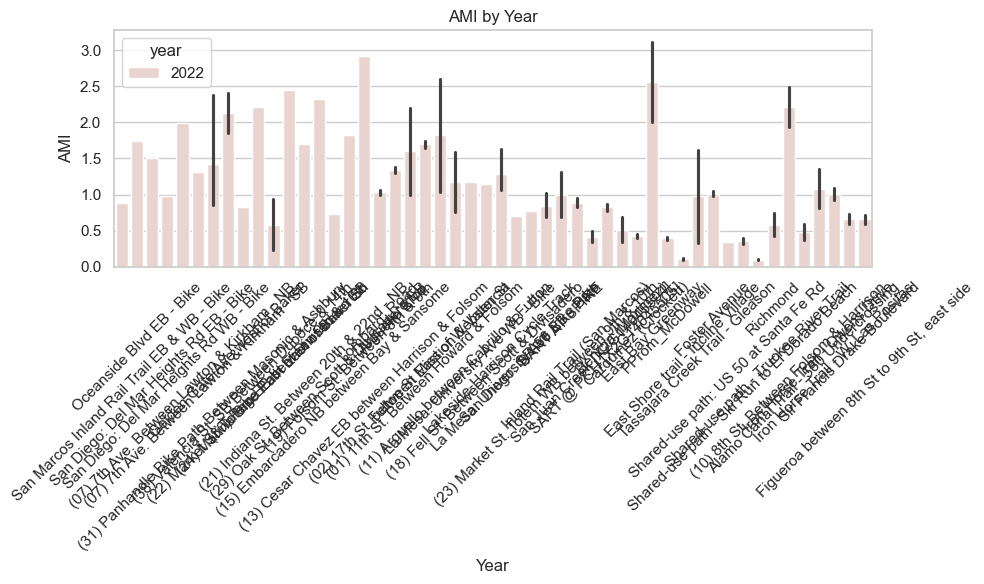

In [155]:
# Create bar plot
plt.figure(figsize=(10, 6))
sns.barplot(data=ma_peak_vol, x="site_name", y="AMI", hue='year')

# Customize plot
plt.title("AMI by Year")
plt.ylabel("AMI")
plt.xlabel("Year")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

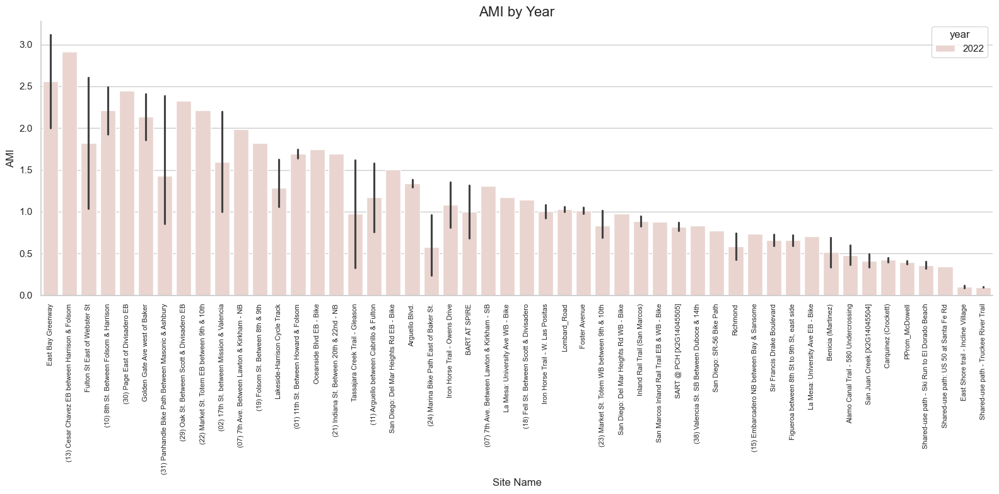

In [156]:
# Sort data by AMI (optional but helps readability)
ma_peak_vol_sorted = ma_peak_vol.sort_values(by='AMI', ascending=False)

# Set figure size based on number of sites
plt.figure(figsize=(16, 8))  # wider and taller

# Plot: barplot with better spacing and horizontal labels
sns.barplot(data=ma_peak_vol_sorted, x="site_name", y="AMI", hue="year", dodge=False)

# Customize plot
plt.title("AMI by Year", fontsize=16)
plt.xlabel("Site Name", fontsize=12)
plt.ylabel("AMI", fontsize=12)

# Rotate x-axis labels vertically or at an angle and wrap long text
plt.xticks(rotation=90, ha='center', fontsize=8)

# Remove top and right spines
sns.despine()

# Tight layout to avoid clipping
plt.tight_layout()

plt.show()

Horizontal Bar chart


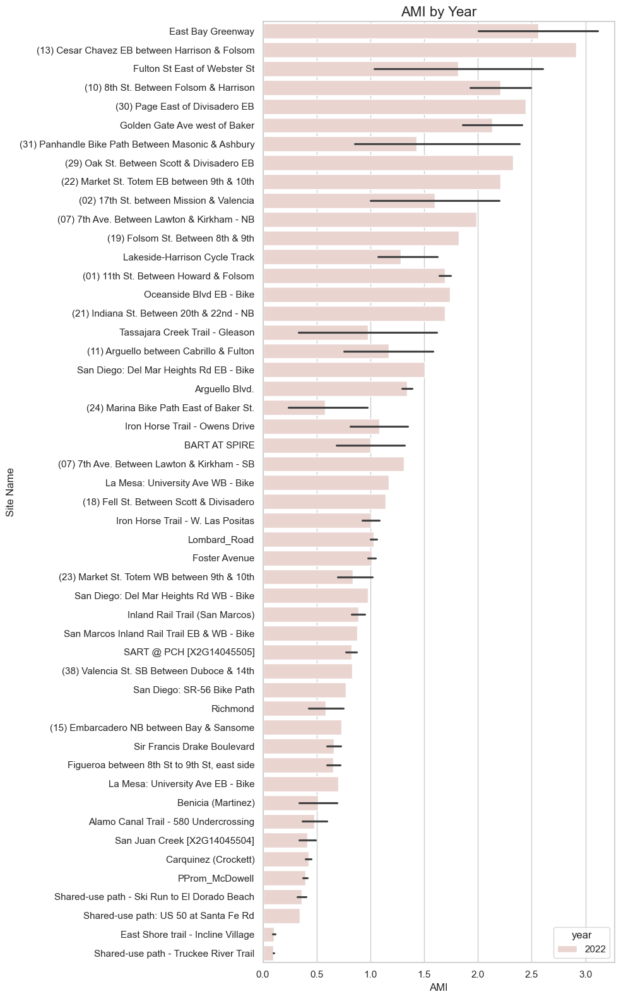

In [157]:
plt.figure(figsize=(10, 16))
sns.barplot(data=ma_peak_vol_sorted, y="site_name", x="AMI", hue="year", dodge=False)
plt.title("AMI by Year", fontsize=16)
plt.xlabel("AMI")
plt.ylabel("Site Name")
plt.tight_layout()
plt.show()

In [158]:
#Calculate WWI Index
# Calcualte daily traffic
daily_traffic=longterm_hourly_bike_clean.groupby(['id','site_name','year','Date','Day'])['counts'].sum().reset_index()
# Calculate weekday traffic
weekday_traffic=daily_traffic[daily_traffic['Day'].isin(['Monday','Tuesday', 'Wednesday','Thursday','Friday'])]
# averge the weekday traffic
weekday_average_traffic=weekday_traffic.groupby(['id','site_name','year'])['counts'].mean().reset_index()
weekday_average_traffic=weekday_average_traffic.rename(columns={'counts':'Wwd'})
# Calculate weekday traffic
weekend_traffic=daily_traffic[daily_traffic['Day'].isin(['Saturday','Sunday'])]
# averge the weekday traffic
weekend_average_traffic=weekend_traffic.groupby(['id','site_name','year'])['counts'].mean().reset_index()
weekend_average_traffic=weekend_average_traffic.rename(columns={'counts':'Wwe'})
# now merge these two daily average 
weekday_weekend_average_traffic=pd.merge(weekday_average_traffic,weekend_average_traffic, on=['id','site_name','year'], how='inner')
weekday_weekend_average_traffic['WWI']=weekday_weekend_average_traffic['Wwe']/weekday_weekend_average_traffic['Wwd']
weekday_weekend_average_traffic.head()

,id,site_name,year,Wwd,Wwe,WWI
0,100005839,San Marcos Inland Rail Trail EB & WB - Bike,2022,173.403846,193.133333,1.113778
1,101003583,Oceanside Blvd EB - Bike,2022,17.176923,13.038095,0.759047
2,101003588,San Diego: Del Mar Heights Rd EB - Bike,2022,12.550000,9.980952,0.795295
3,101003589,San Diego: Del Mar Heights Rd WB - Bike,2022,16.776923,16.580952,0.988319
4,101005214,(07) 7th Ave. Between Lawton & Kirkham - NB,2022,144.442308,150.447619,1.041576


In [159]:
# Now combine AMI and WWI index together
ami_wwi=pd.merge(ma_peak_vol,weekday_weekend_average_traffic, on=['id','site_name','year'], how='inner')
ami_wwi

,id,site_name,year,Vh_7_8,Vh_11_12,AMI,Wwd,Wwe,WWI
0,100005839,San Marcos Inland Rail Trail EB & WB - Bike,2022,21.253846,24.180769,0.878957,173.403846,193.133333,1.113778
1,101003583,Oceanside Blvd EB - Bike,2022,3.030769,1.738462,1.743363,17.176923,13.038095,0.759047
2,101003588,San Diego: Del Mar Heights Rd EB - Bike,2022,2.180769,1.446154,1.507979,12.550000,9.980952,0.795295
3,101003589,San Diego: Del Mar Heights Rd WB - Bike,2022,1.884615,1.930769,0.976096,16.776923,16.580952,0.988319
4,101005214,(07) 7th Ave. Between Lawton & Kirkham - NB,2022,31.353846,15.780769,1.986839,144.442308,150.447619,1.041576
...,...,...,...,...,...,...,...,...,...
84,353260909,Sir Francis Drake Boulevard,2022,5.565385,7.676923,0.724950,43.111538,119.209524,2.765142
85,353260910,Sir Francis Drake Boulevard,2022,3.026923,5.103846,0.593067,26.915385,76.085714,2.826848
86,353291773,"Figueroa between 8th St to 9th St, east side",2022,34.953846,48.476923,0.721041,444.703846,417.476190,0.938774
87,353291774,"Figueroa between 8th St to 9th St, east side",2022,8.103846,13.646154,0.593856,129.876923,127.666667,0.982982


In [160]:
ami_wwi['Site_class']=ami_wwi.apply(lambda row: site_class(row['AMI'],row['WWI']),axis=1)
ami_wwi

,id,site_name,year,Vh_7_8,Vh_11_12,AMI,Wwd,Wwe,WWI,Site_class
0,100005839,San Marcos Inland Rail Trail EB & WB - Bike,2022,21.253846,24.180769,0.878957,173.403846,193.133333,1.113778,non_commute
1,101003583,Oceanside Blvd EB - Bike,2022,3.030769,1.738462,1.743363,17.176923,13.038095,0.759047,commute
2,101003588,San Diego: Del Mar Heights Rd EB - Bike,2022,2.180769,1.446154,1.507979,12.550000,9.980952,0.795295,commute
3,101003589,San Diego: Del Mar Heights Rd WB - Bike,2022,1.884615,1.930769,0.976096,16.776923,16.580952,0.988319,mixed
4,101005214,(07) 7th Ave. Between Lawton & Kirkham - NB,2022,31.353846,15.780769,1.986839,144.442308,150.447619,1.041576,mixed
...,...,...,...,...,...,...,...,...,...,...
84,353260909,Sir Francis Drake Boulevard,2022,5.565385,7.676923,0.724950,43.111538,119.209524,2.765142,non_commute
85,353260910,Sir Francis Drake Boulevard,2022,3.026923,5.103846,0.593067,26.915385,76.085714,2.826848,non_commute
86,353291773,"Figueroa between 8th St to 9th St, east side",2022,34.953846,48.476923,0.721041,444.703846,417.476190,0.938774,mixed
87,353291774,"Figueroa between 8th St to 9th St, east side",2022,8.103846,13.646154,0.593856,129.876923,127.666667,0.982982,mixed


In [161]:
# You're trying to verify whether each intersection has a consistent Site_class across different years 
# i.e., whether the classification of the site (e.g., Residential, Commercial, Mixed) remains the same over time.
check_site_class_consistency=ami_wwi.groupby(['site_name','year','Site_class'])['id'].count().reset_index()
check_site_class_consistency.tail(40)

,site_name,year,Site_class,id
18,(31) Panhandle Bike Path Between Masonic & Ashbury,2022,non_commute,2
19,(38) Valencia St. SB Between Duboce & 14th,2022,mixed,1
20,Alamo Canal Trail - 580 Undercrossing,2022,non_commute,2
21,Arguello Blvd.,2022,non_commute,2
22,BART AT SPIRE,2022,non_commute,2
23,Benicia (Martinez),2022,non_commute,2
24,Carquinez (Crockett),2022,non_commute,2
25,East Bay Greenway,2022,commute,2
26,East Shore trail - Incline Village,2022,non_commute,2
27,"Figueroa between 8th St to 9th St, east side",2022,mixed,2


In [162]:
ami_wwi.shape, strata.shape

((89, 10), (337, 10))

In [163]:
ami_wwi.head()



,id,site_name,year,Vh_7_8,Vh_11_12,AMI,Wwd,Wwe,WWI,Site_class
0,100005839,San Marcos Inland Rail Trail EB & WB - Bike,2022,21.253846,24.180769,0.878957,173.403846,193.133333,1.113778,non_commute
1,101003583,Oceanside Blvd EB - Bike,2022,3.030769,1.738462,1.743363,17.176923,13.038095,0.759047,commute
2,101003588,San Diego: Del Mar Heights Rd EB - Bike,2022,2.180769,1.446154,1.507979,12.550000,9.980952,0.795295,commute
3,101003589,San Diego: Del Mar Heights Rd WB - Bike,2022,1.884615,1.930769,0.976096,16.776923,16.580952,0.988319,mixed
4,101005214,(07) 7th Ave. Between Lawton & Kirkham - NB,2022,31.353846,15.780769,1.986839,144.442308,150.447619,1.041576,mixed


In [164]:
strata.head()

,id,site_name,latitude,longitude,geometry,M_Zone,index_right,UATYP10,FUNCSTAT10,RSU_Zone
0,103000671,BART AT SPIRE,37.791160,-122.459440,POINT (-216265.953 -22230.133),Non-mountain,122.0,U,S,urban
8759,104000671,BART AT SPIRE,37.791160,-122.459440,POINT (-216265.953 -22230.133),Non-mountain,122.0,U,S,urban
17518,101001127,Broadway Tunnel west of Hyde St Overpass EB (old),37.796165,-122.419490,POINT (-212739.601 -21764.313),Non-mountain,122.0,U,S,urban
26277,101002415,Fell Street west of Scott WB (old site),37.774200,-122.436295,POINT (-214279.637 -24167.446),Non-mountain,122.0,U,S,urban
35036,102002415,Fell Street west of Scott WB (old site),37.774200,-122.436295,POINT (-214279.637 -24167.446),Non-mountain,122.0,U,S,urban


In [165]:
# now join with meta data class
meta_ami_pmi_class=pd.merge(ami_wwi,strata, on=['id','site_name'], how='inner')
meta_ami_pmi_class.head()                     

,id,site_name,year,Vh_7_8,Vh_11_12,AMI,Wwd,Wwe,WWI,Site_class,latitude,longitude,geometry,M_Zone,index_right,UATYP10,FUNCSTAT10,RSU_Zone
0,100005839,San Marcos Inland Rail Trail EB & WB - Bike,2022,21.253846,24.180769,0.878957,173.403846,193.133333,1.113778,non_commute,33.146435,-117.181990,POINT (263115.257 -536888.026),Non-mountain,121.0,U,S,urban
1,101003583,Oceanside Blvd EB - Bike,2022,3.030769,1.738462,1.743363,17.176923,13.038095,0.759047,commute,33.203194,-117.311570,POINT (250841.477 -530952.381),Non-mountain,121.0,U,S,urban
2,101003588,San Diego: Del Mar Heights Rd EB - Bike,2022,2.180769,1.446154,1.507979,12.550000,9.980952,0.795295,commute,32.955450,-117.230970,POINT (259161.243 -558173.461),Non-mountain,121.0,U,S,urban
3,101003589,San Diego: Del Mar Heights Rd WB - Bike,2022,1.884615,1.930769,0.976096,16.776923,16.580952,0.988319,mixed,32.955374,-117.230947,POINT (259163.641 -558181.814),Non-mountain,121.0,U,S,urban
4,101005214,(07) 7th Ave. Between Lawton & Kirkham - NB,2022,31.353846,15.780769,1.986839,144.442308,150.447619,1.041576,mixed,37.759250,-122.463770,POINT (-216738.791 -25766.38),Non-mountain,122.0,U,S,urban


In [166]:
# Apply the group function
# .apply(...) is used on the entire DataFrame meta_ami_pmi_class, and it applies the function defined by lambda row: ... to each row (because axis=1).
# lambda row: ...: an anonymous function that takes a row of the DataFrame.
# For example: df['Sum'] = df.apply(lambda row: row['A'] + row['B'], axis=1)
# Here, row['A'] + row['B'] is calculated for each row, and the result is stored in a new column Sum.
meta_ami_pmi_class['Site_Group'] = meta_ami_pmi_class.apply(
    lambda row: group(row['M_Zone'], row['RSU_Zone'], row['Site_class']),
    axis=1
)
meta_ami_pmi_class.head()

,id,site_name,year,Vh_7_8,Vh_11_12,AMI,Wwd,Wwe,WWI,Site_class,latitude,longitude,geometry,M_Zone,index_right,UATYP10,FUNCSTAT10,RSU_Zone,Site_Group
0,100005839,San Marcos Inland Rail Trail EB & WB - Bike,2022,21.253846,24.180769,0.878957,173.403846,193.133333,1.113778,non_commute,33.146435,-117.181990,POINT (263115.257 -536888.026),Non-mountain,121.0,U,S,urban,Non-mountain_urban_non-commute_site
1,101003583,Oceanside Blvd EB - Bike,2022,3.030769,1.738462,1.743363,17.176923,13.038095,0.759047,commute,33.203194,-117.311570,POINT (250841.477 -530952.381),Non-mountain,121.0,U,S,urban,Non-mountain_urban_commute_site
2,101003588,San Diego: Del Mar Heights Rd EB - Bike,2022,2.180769,1.446154,1.507979,12.550000,9.980952,0.795295,commute,32.955450,-117.230970,POINT (259161.243 -558173.461),Non-mountain,121.0,U,S,urban,Non-mountain_urban_commute_site
3,101003589,San Diego: Del Mar Heights Rd WB - Bike,2022,1.884615,1.930769,0.976096,16.776923,16.580952,0.988319,mixed,32.955374,-117.230947,POINT (259163.641 -558181.814),Non-mountain,121.0,U,S,urban,Non-mountain_urban_mixed_site
4,101005214,(07) 7th Ave. Between Lawton & Kirkham - NB,2022,31.353846,15.780769,1.986839,144.442308,150.447619,1.041576,mixed,37.759250,-122.463770,POINT (-216738.791 -25766.38),Non-mountain,122.0,U,S,urban,Non-mountain_urban_mixed_site


In [167]:
meta_ami_pmi_class.groupby(['Site_Group'])['Site_Group'].count()

Site_Group
Mountain_rural_non-commute_site            4
Mountain_suburban_non-commute_site         3
Non-mountain_suburban_mixed_site           1
Non-mountain_suburban_non-commute_site     1
Non-mountain_urban_commute_site           18
Non-mountain_urban_mixed_site             17
Non-mountain_urban_non-commute_site       45
Name: Site_Group, dtype: int64

In [168]:
# Step 1: Randomly select 2 rows (i.e., 2 locations) per remaining Site_Group
# .apply(lambda x: x.sample(n=1, random_state=95829)): For each group, randomly selects 1 row.
# random_state=95829: Ensures the random sampling is reproducible (same result every time you run).
# .reset_index(drop=True): Cleans up the index after grouping and sampling.
holdout_data_for_test= (
    meta_ami_pmi_class.groupby('Site_Group', group_keys=False)
    .apply(lambda x: x.sample(n=1, random_state=95829))  # random_state for reproducibility
    .reset_index(drop=True)
)

# Step 2: Create Set B = all data EXCEPT those selected in set_A
# Use Loc_id + Site_Group to identify which rows to exclude
# Creates a set of (Loc_id, Site_Group) pairs from the holdout set.
# These act as unique identifiers to filter them out from the full dataset.
set_A_keys = set(zip(holdout_data_for_test['id'], holdout_data_for_test['Site_Group']))

# Keep rows NOT in set_A
# .apply(lambda row: ...) checks for each row if its (Loc_id, Site_Group) is in the set_A_keys.
# The tilde (~) means NOT — so we keep only the rows not in the holdout set.
# Final result: data_for_factor_development contains the training/development data.
data_for_factor_development = meta_ami_pmi_class[~meta_ami_pmi_class.apply(lambda row: (row['id'], row['Site_Group']) in set_A_keys, axis=1)]
data_for_factor_development.head()

C:\Users\Soumyadip Maitra\AppData\Local\Temp\ipykernel_17196\3614242792.py:7: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(n=1, random_state=95829))  # random_state for reproducibility


,id,site_name,year,Vh_7_8,Vh_11_12,AMI,Wwd,Wwe,WWI,Site_class,latitude,longitude,geometry,M_Zone,index_right,UATYP10,FUNCSTAT10,RSU_Zone,Site_Group
0,100005839,San Marcos Inland Rail Trail EB & WB - Bike,2022,21.253846,24.180769,0.878957,173.403846,193.133333,1.113778,non_commute,33.146435,-117.181990,POINT (263115.257 -536888.026),Non-mountain,121.0,U,S,urban,Non-mountain_urban_non-commute_site
1,101003583,Oceanside Blvd EB - Bike,2022,3.030769,1.738462,1.743363,17.176923,13.038095,0.759047,commute,33.203194,-117.311570,POINT (250841.477 -530952.381),Non-mountain,121.0,U,S,urban,Non-mountain_urban_commute_site
2,101003588,San Diego: Del Mar Heights Rd EB - Bike,2022,2.180769,1.446154,1.507979,12.550000,9.980952,0.795295,commute,32.955450,-117.230970,POINT (259161.243 -558173.461),Non-mountain,121.0,U,S,urban,Non-mountain_urban_commute_site
3,101003589,San Diego: Del Mar Heights Rd WB - Bike,2022,1.884615,1.930769,0.976096,16.776923,16.580952,0.988319,mixed,32.955374,-117.230947,POINT (259163.641 -558181.814),Non-mountain,121.0,U,S,urban,Non-mountain_urban_mixed_site
4,101005214,(07) 7th Ave. Between Lawton & Kirkham - NB,2022,31.353846,15.780769,1.986839,144.442308,150.447619,1.041576,mixed,37.759250,-122.463770,POINT (-216738.791 -25766.38),Non-mountain,122.0,U,S,urban,Non-mountain_urban_mixed_site


In [169]:
holdout_data_for_test.shape[0]+data_for_factor_development.shape[0]==meta_ami_pmi_class.shape[0]

True

In [170]:
holdout_data_for_test.groupby(['Site_Group'])['Site_Group'].count()

Site_Group
Mountain_rural_non-commute_site           1
Mountain_suburban_non-commute_site        1
Non-mountain_suburban_mixed_site          1
Non-mountain_suburban_non-commute_site    1
Non-mountain_urban_commute_site           1
Non-mountain_urban_mixed_site             1
Non-mountain_urban_non-commute_site       1
Name: Site_Group, dtype: int64

In [171]:
data_for_factor_development.groupby(['Site_Group'])['Site_Group'].count()

Site_Group
Mountain_rural_non-commute_site         3
Mountain_suburban_non-commute_site      2
Non-mountain_urban_commute_site        17
Non-mountain_urban_mixed_site          16
Non-mountain_urban_non-commute_site    44
Name: Site_Group, dtype: int64

Task 04: Calculate the expansion factors from the clean dataset

In [172]:
longterm_hourly_bike_clean.head()

,id,site_name,year,month,Day,date,counts,hour,Date,prev_hour_count,flag,long_term
0,100005839,San Marcos Inland Rail Trail EB & WB - Bike,2022,April,Friday,2022-04-01 00:00:00+00:00,0.0,0,2022-04-01,NaN,False,long_term
1,100005839,San Marcos Inland Rail Trail EB & WB - Bike,2022,April,Friday,2022-04-01 01:00:00+00:00,0.0,1,2022-04-01,0.0,False,long_term
2,100005839,San Marcos Inland Rail Trail EB & WB - Bike,2022,April,Friday,2022-04-01 02:00:00+00:00,0.0,2,2022-04-01,0.0,False,long_term
3,100005839,San Marcos Inland Rail Trail EB & WB - Bike,2022,April,Friday,2022-04-01 03:00:00+00:00,1.0,3,2022-04-01,0.0,False,long_term
4,100005839,San Marcos Inland Rail Trail EB & WB - Bike,2022,April,Friday,2022-04-01 04:00:00+00:00,0.0,4,2022-04-01,1.0,False,long_term


In [173]:
site_class=meta_ami_pmi_class[['id','site_name','year','Site_Group']]
longterm_hourly_bike_clean_data_with_group=pd.merge(longterm_hourly_bike_clean,site_class,on=['id','site_name','year'], how='inner')
longterm_hourly_bike_clean_data_with_group.head()

,id,site_name,year,month,Day,date,counts,hour,Date,prev_hour_count,flag,long_term,Site_Group
0,100005839,San Marcos Inland Rail Trail EB & WB - Bike,2022,April,Friday,2022-04-01 00:00:00+00:00,0.0,0,2022-04-01,NaN,False,long_term,Non-mountain_urban_non-commute_site
1,100005839,San Marcos Inland Rail Trail EB & WB - Bike,2022,April,Friday,2022-04-01 01:00:00+00:00,0.0,1,2022-04-01,0.0,False,long_term,Non-mountain_urban_non-commute_site
2,100005839,San Marcos Inland Rail Trail EB & WB - Bike,2022,April,Friday,2022-04-01 02:00:00+00:00,0.0,2,2022-04-01,0.0,False,long_term,Non-mountain_urban_non-commute_site
3,100005839,San Marcos Inland Rail Trail EB & WB - Bike,2022,April,Friday,2022-04-01 03:00:00+00:00,1.0,3,2022-04-01,0.0,False,long_term,Non-mountain_urban_non-commute_site
4,100005839,San Marcos Inland Rail Trail EB & WB - Bike,2022,April,Friday,2022-04-01 04:00:00+00:00,0.0,4,2022-04-01,1.0,False,long_term,Non-mountain_urban_non-commute_site


In [174]:
# Now apply the AADT and MADT function to calculate these two metrics
AADT, MADT = AASHTO_AADT(longterm_hourly_bike_clean_data_with_group)

In [175]:
AADT.head()

,id,site_name,Site_Group,year,wt_count,days_Ct,AADT
0,100005839,San Marcos Inland Rail Trail EB & WB - Bike,Non-mountain_urban_non-commute_site,2022,1568612.10,8759,179
1,101003583,Oceanside Blvd EB - Bike,Non-mountain_urban_commute_site,2022,140030.00,8759,16
2,101003588,San Diego: Del Mar Heights Rd EB - Bike,Non-mountain_urban_commute_site,2022,103467.35,8759,12
3,101003589,San Diego: Del Mar Heights Rd WB - Bike,Non-mountain_urban_mixed_site,2022,146473.55,8759,17
4,101005214,(07) 7th Ave. Between Lawton & Kirkham - NB,Non-mountain_urban_mixed_site,2022,1280413.00,8759,146


In [176]:
MADT.head()

,id,site_name,Site_Group,year,month,wt_count,dm,MADT
0,100005839,San Marcos Inland Rail Trail EB & WB - Bike,Non-mountain_urban_non-commute_site,2022,April,142920.0,720,198
1,100005839,San Marcos Inland Rail Trail EB & WB - Bike,Non-mountain_urban_non-commute_site,2022,August,149592.0,744,201
2,100005839,San Marcos Inland Rail Trail EB & WB - Bike,Non-mountain_urban_non-commute_site,2022,December,96956.1,743,130
3,100005839,San Marcos Inland Rail Trail EB & WB - Bike,Non-mountain_urban_non-commute_site,2022,February,101976.0,672,152
4,100005839,San Marcos Inland Rail Trail EB & WB - Bike,Non-mountain_urban_non-commute_site,2022,January,121464.0,744,163


In [177]:
# Now lets calculate DOWOMIF
dowom_count=longterm_hourly_bike_clean_data_with_group.groupby(['id', 'site_name', 'Site_Group',
            'year', 'month','Date', 'Day'])['counts'].sum().reset_index()
dowom_count1=dowom_count.groupby(['id', 'site_name', 'Site_Group',
            'year', 'month', 'Day'])['counts'].mean().reset_index()
# lets join with AADT 
dowom_factor=pd.merge(dowom_count1,AADT, on=['id', 'site_name', 'Site_Group',
            'year'])
dowom_factor["DOWOMIF"]=dowom_factor['counts']/dowom_factor['AADT']
# Now average the factor by group
dowom_factor_avg=dowom_factor.groupby(['Site_Group','year', 'month', 'Day']).agg(
    DOWOMIF=('DOWOMIF', 'mean'),
    num_sites = ('id','nunique')
).reset_index()
dowom_factor_avg.head()

,Site_Group,year,month,Day,DOWOMIF,num_sites
0,Mountain_rural_non-commute_site,2022,April,Friday,0.416367,4
1,Mountain_rural_non-commute_site,2022,April,Monday,0.235073,4
2,Mountain_rural_non-commute_site,2022,April,Saturday,0.736415,4
3,Mountain_rural_non-commute_site,2022,April,Sunday,0.721546,4
4,Mountain_rural_non-commute_site,2022,April,Thursday,0.284924,4


In [178]:
dowom_factor_avg.groupby(['Site_Group','year'])['year'].count()

Site_Group                              year
Mountain_rural_non-commute_site         2022    84
Mountain_suburban_non-commute_site      2022    84
Non-mountain_suburban_mixed_site        2022    84
Non-mountain_suburban_non-commute_site  2022    84
Non-mountain_urban_commute_site         2022    84
Non-mountain_urban_mixed_site           2022    84
Non-mountain_urban_non-commute_site     2022    84
Name: year, dtype: int64

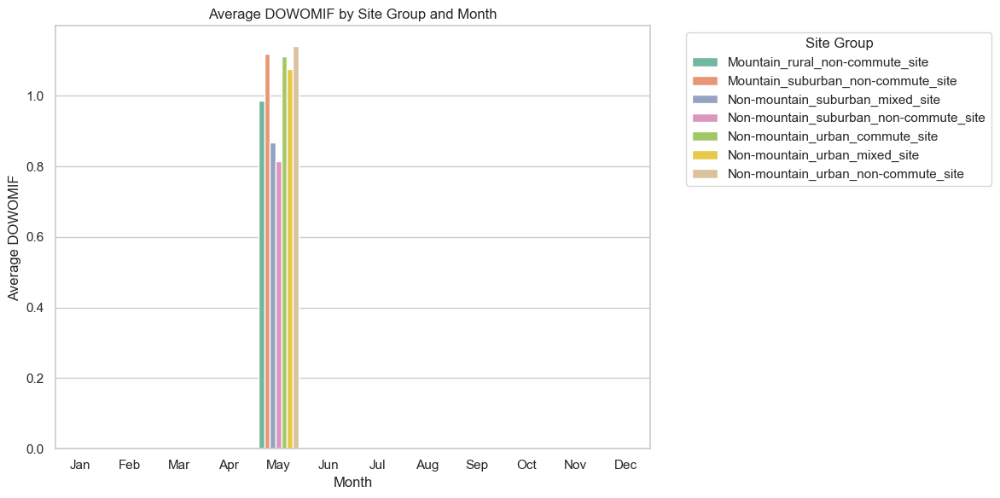

In [179]:
# Aggregate by Site_Group and month
dowomif_monthly_avg = dowom_factor_avg.groupby(['Site_Group', 'month'])['DOWOMIF'].mean().reset_index()

# Optional: set month order if not already in order
month_order = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
               'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
dowomif_monthly_avg['month'] = pd.Categorical(dowomif_monthly_avg['month'], categories=month_order, ordered=True)

# Sort for consistent plotting
dowomif_monthly_avg = dowomif_monthly_avg.sort_values(['month', 'Site_Group'])

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(
    data=dowomif_monthly_avg,
    x='month',
    y='DOWOMIF',
    hue='Site_Group',
    palette='Set2'
)

plt.title('Average DOWOMIF by Site Group and Month')
plt.xlabel('Month')
plt.ylabel('Average DOWOMIF')
plt.legend(title='Site Group', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [180]:
import calendar

# Create a mapping from full month names to 3-letter abbreviations
month_map = {month: calendar.month_abbr[i] for i, month in enumerate(calendar.month_name) if month}
dowom_factor_avg['month'] = dowom_factor_avg['month'].map(month_map)

In [181]:
dowomif_monthly_avg = dowom_factor_avg.groupby(['Site_Group', 'month'])['DOWOMIF'].mean().reset_index()


In [182]:
# Get unique site groups
site_groups = dowomif_monthly_avg['Site_Group'].unique()

# Create a full multi-index of all site group × month combinations
import itertools

full_index = pd.MultiIndex.from_product(
    [site_groups, month_order],
    names=['Site_Group', 'month']
)

# Reindex the DataFrame to fill in missing combinations with NaN
dowomif_monthly_avg = (
    dowomif_monthly_avg
    .set_index(['Site_Group', 'month'])
    .reindex(full_index)
    .reset_index()
)


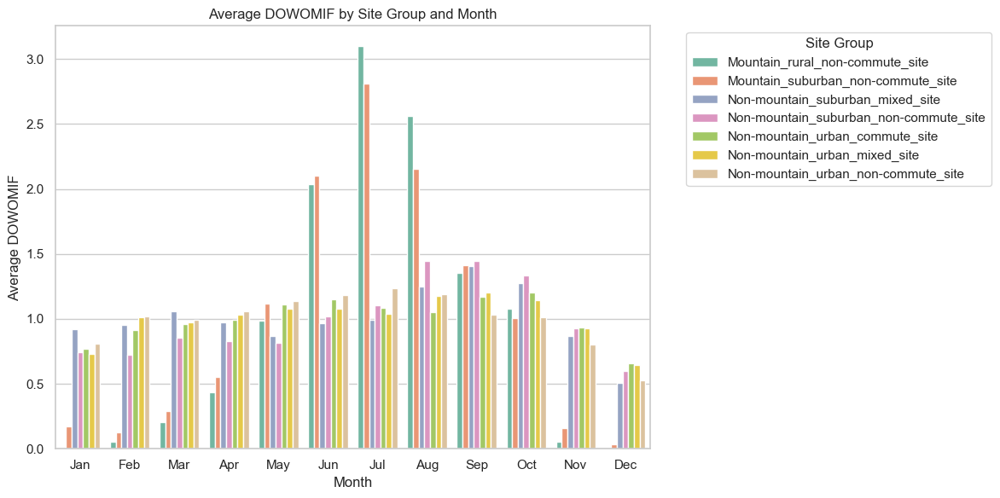

In [183]:
# Set categorical month order again (just to be safe)
dowomif_monthly_avg['month'] = pd.Categorical(
    dowomif_monthly_avg['month'], categories=month_order, ordered=True
)

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(
    data=dowomif_monthly_avg,
    x='month',
    y='DOWOMIF',
    hue='Site_Group',
    palette='Set2'
)

plt.title('Average DOWOMIF by Site Group and Month')
plt.xlabel('Month')
plt.ylabel('Average DOWOMIF')
plt.legend(title='Site Group', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [184]:
dowom_factor_avg.to_csv("G:\\OTHERS\\RESEARCH\\MINTU SIR\\WORKING 05\\DOWOM_Factor_Dev_Materials\\Dowom_factor_avg.csv", index=False)


Task 05: Calculate the accuracy on holdout sites

In [185]:
# get the holdoutsite data
holdout_site_class=holdout_data_for_test[['id','site_name','year','Site_Group']]
holdout_longterm_hourly_bike_clean_data_with_group=pd.merge(longterm_hourly_bike_clean,holdout_site_class,on=['id','site_name','year'], how='inner')
holdout_longterm_hourly_bike_clean_data_with_group['week_of_year'] = pd.to_datetime(holdout_longterm_hourly_bike_clean_data_with_group['date']).dt.isocalendar().week
holdout_longterm_hourly_bike_clean_data_with_group.head()

,id,site_name,year,month,Day,date,counts,hour,Date,prev_hour_count,flag,long_term,Site_Group,week_of_year
0,101005215,(07) 7th Ave. Between Lawton & Kirkham - SB,2022,April,Friday,2022-04-01 00:00:00+00:00,0.0,0,2022-04-01,NaN,False,long_term,Non-mountain_urban_non-commute_site,13
1,101005215,(07) 7th Ave. Between Lawton & Kirkham - SB,2022,April,Friday,2022-04-01 01:00:00+00:00,1.0,1,2022-04-01,0.0,False,long_term,Non-mountain_urban_non-commute_site,13
2,101005215,(07) 7th Ave. Between Lawton & Kirkham - SB,2022,April,Friday,2022-04-01 02:00:00+00:00,0.0,2,2022-04-01,1.0,False,long_term,Non-mountain_urban_non-commute_site,13
3,101005215,(07) 7th Ave. Between Lawton & Kirkham - SB,2022,April,Friday,2022-04-01 03:00:00+00:00,0.0,3,2022-04-01,0.0,False,long_term,Non-mountain_urban_non-commute_site,13
4,101005215,(07) 7th Ave. Between Lawton & Kirkham - SB,2022,April,Friday,2022-04-01 04:00:00+00:00,0.0,4,2022-04-01,0.0,False,long_term,Non-mountain_urban_non-commute_site,13


In [186]:
# Now apply the AADT and MADT function to calculate these two metrics
holdout_AADT, holdout_MADT = AASHTO_AADT(holdout_longterm_hourly_bike_clean_data_with_group)
holdout_AADT=holdout_AADT.rename(columns={'AADT':'Observed_AADT'})
holdout_AADT

,id,site_name,Site_Group,year,wt_count,days_Ct,Observed_AADT
0,101005215,(07) 7th Ave. Between Lawton & Kirkham - SB,Non-mountain_urban_non-commute_site,2022,1066697.00,8759,122
1,101018388,(21) Indiana St. Between 20th & 22nd - NB,Non-mountain_urban_commute_site,2022,1374617.15,8759,157
2,101047049,Lakeside-Harrison Cycle Track,Non-mountain_urban_mixed_site,2022,4566844.85,8757,522
3,103038655,East Shore trail - Incline Village,Mountain_rural_non-commute_site,2022,1047096.00,8759,120
4,103041347,Foster Avenue,Non-mountain_suburban_mixed_site,2022,456532.75,8759,52
5,103049628,Shared-use path: US 50 at Santa Fe Rd,Mountain_suburban_non-commute_site,2022,113352.00,8759,13
6,104041347,Foster Avenue,Non-mountain_suburban_non-commute_site,2022,217495.60,8759,25


In [187]:
# combine all sites AADT and Save it
# This code snippet is about combining AADT data (Annual Average Daily Traffic) from two sources — your main dataset and a holdout/test dataset — and then saving the
# combined result as a CSV file.
# The holdout_AADT DataFrame has a column named 'Observed_AADT'
# This line renames it to 'AADT' so it matches the column name in the main dataset (AADT).
# pd.concat([...], axis=0) stacks the two DataFrames vertically (row-wise).
holdout_AADT1=holdout_AADT.rename(columns={'Observed_AADT':'AADT'})
All_Sites_AADT=pd.concat([AADT,holdout_AADT1],axis=0)
All_Sites_AADT.to_csv("G:\\OTHERS\\RESEARCH\\MINTU SIR\\WORKING 05\\DOWOM_Factor_Dev_Materials\\All eligible site bike AADT\\All_Eligible_Sites_Bike_AADT.csv", index = False)

In [188]:
# Now imput the volume
dowom_count_test=holdout_longterm_hourly_bike_clean_data_with_group.groupby(['id', 'site_name', 'Site_Group',
            'year', 'month', 'Day','Date','week_of_year'])['counts'].sum().reset_index()
dowom_count_test1=dowom_count_test.groupby(['id', 'site_name', 'Site_Group',
            'year', 'month', 'Day','week_of_year'])['counts'].mean().reset_index()

imputed_aadt=pd.merge(dowom_count_test,dowom_factor_avg, on=['Site_Group','year', 'month', 'Day'],how='inner')
imputed_aadt['Imputed_AADT']=imputed_aadt['counts']/imputed_aadt['DOWOMIF']
imputed_aadt_ave=imputed_aadt.groupby(['id','site_name','Site_Group','year','week_of_year']).agg(Imputed_AADT=('Imputed_AADT','mean')).reset_index()
imputed_aadt_ave

,id,site_name,Site_Group,year,week_of_year,Imputed_AADT
0,101005215,(07) 7th Ave. Between Lawton & Kirkham - SB,Non-mountain_urban_non-commute_site,2022,17,112.341449
1,101005215,(07) 7th Ave. Between Lawton & Kirkham - SB,Non-mountain_urban_non-commute_site,2022,18,110.596451
2,101005215,(07) 7th Ave. Between Lawton & Kirkham - SB,Non-mountain_urban_non-commute_site,2022,19,119.503771
3,101005215,(07) 7th Ave. Between Lawton & Kirkham - SB,Non-mountain_urban_non-commute_site,2022,20,120.459438
4,101005215,(07) 7th Ave. Between Lawton & Kirkham - SB,Non-mountain_urban_non-commute_site,2022,21,117.813462
5,101005215,(07) 7th Ave. Between Lawton & Kirkham - SB,Non-mountain_urban_non-commute_site,2022,22,121.637921
6,101018388,(21) Indiana St. Between 20th & 22nd - NB,Non-mountain_urban_commute_site,2022,17,134.918887
7,101018388,(21) Indiana St. Between 20th & 22nd - NB,Non-mountain_urban_commute_site,2022,18,149.096244
8,101018388,(21) Indiana St. Between 20th & 22nd - NB,Non-mountain_urban_commute_site,2022,19,153.434037
9,101018388,(21) Indiana St. Between 20th & 22nd - NB,Non-mountain_urban_commute_site,2022,20,149.650613


In [189]:
imputed_aadt.groupby(['Site_Group'])['DOWOMIF'].describe()

,count,mean,std,min,25%,50%,75%,max
Site_Group,,,,,,,,
Mountain_rural_non-commute_site,31.0,0.990079,0.381692,0.702320,0.721556,0.790943,1.520377,1.615128
Mountain_suburban_non-commute_site,31.0,1.114558,0.264100,0.886140,0.951457,0.986759,1.357669,1.667046
Non-mountain_suburban_mixed_site,31.0,0.877171,0.118505,0.730769,0.771635,0.842308,0.957692,1.073077
Non-mountain_suburban_non-commute_site,31.0,0.805161,0.107947,0.672000,0.720000,0.820000,0.890000,0.980000
Non-mountain_urban_commute_site,31.0,1.106246,0.193621,0.793069,0.897027,1.176212,1.278897,1.340430
Non-mountain_urban_mixed_site,31.0,1.075513,0.044183,1.003892,1.055523,1.064017,1.119236,1.141195
Non-mountain_urban_non-commute_site,31.0,1.142514,0.229072,0.964627,0.989989,1.009663,1.433131,1.559307


In [190]:
imputed_observed_AADT=pd.merge(holdout_AADT,imputed_aadt, on=['id','site_name','Site_Group','year'],how='inner')
imputed_observed_AADT

,id,site_name,Site_Group,year,wt_count,days_Ct,Observed_AADT,month,Day,Date,week_of_year,counts,DOWOMIF,num_sites,Imputed_AADT
0,101005215,(07) 7th Ave. Between Lawton & Kirkham - SB,Non-mountain_urban_non-commute_site,2022,1066697.0,8759,122,May,Friday,2022-05-06,18,119.0,0.977944,45,121.683901
1,101005215,(07) 7th Ave. Between Lawton & Kirkham - SB,Non-mountain_urban_non-commute_site,2022,1066697.0,8759,122,May,Friday,2022-05-13,19,140.0,0.977944,45,143.157531
2,101005215,(07) 7th Ave. Between Lawton & Kirkham - SB,Non-mountain_urban_non-commute_site,2022,1066697.0,8759,122,May,Friday,2022-05-20,20,124.0,0.977944,45,126.796670
3,101005215,(07) 7th Ave. Between Lawton & Kirkham - SB,Non-mountain_urban_non-commute_site,2022,1066697.0,8759,122,May,Friday,2022-05-27,21,128.0,0.977944,45,130.886885
4,101005215,(07) 7th Ave. Between Lawton & Kirkham - SB,Non-mountain_urban_non-commute_site,2022,1066697.0,8759,122,May,Monday,2022-05-02,18,104.0,1.037667,45,100.224839
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
212,104041347,Foster Avenue,Non-mountain_suburban_non-commute_site,2022,217495.6,8759,25,May,Tuesday,2022-05-31,22,44.0,0.736000,1,59.782609
213,104041347,Foster Avenue,Non-mountain_suburban_non-commute_site,2022,217495.6,8759,25,May,Wednesday,2022-05-04,18,22.0,0.980000,1,22.448980
214,104041347,Foster Avenue,Non-mountain_suburban_non-commute_site,2022,217495.6,8759,25,May,Wednesday,2022-05-11,19,22.0,0.980000,1,22.448980
215,104041347,Foster Avenue,Non-mountain_suburban_non-commute_site,2022,217495.6,8759,25,May,Wednesday,2022-05-18,20,27.0,0.980000,1,27.551020


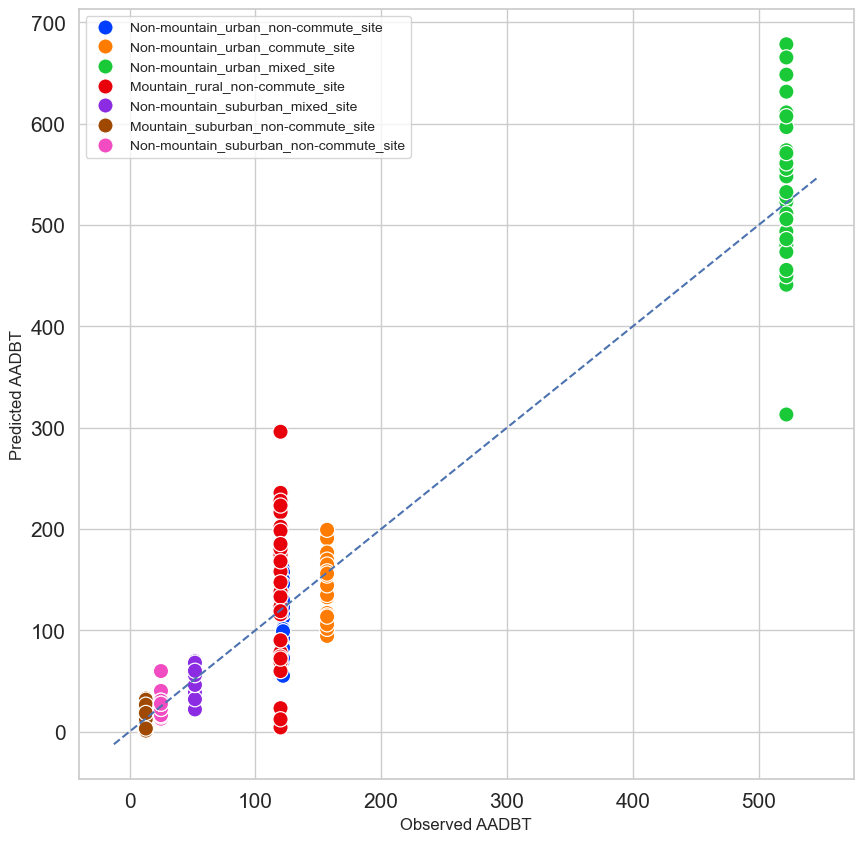

In [191]:
#hue_order = ['Mountain_suburban_mixed_site','Non-mountain_urban_non-commute_site', 'Non-mountain_urban_mixed_site']
#sns.set(font_scale=3) 
# It visually compares: Observed_AADT (ground truth) and Imputed_AADT (predicted value from your model or estimation method)
# Sets the plot size to 10x10 inches.
plt.figure(figsize=(10,10))
g=sns.scatterplot(data=imputed_observed_AADT, x="Observed_AADT", y="Imputed_AADT", hue="Site_Group", palette="bright",s=120)
g.set(xlabel='Observed AADBT', ylabel='Predicted AADBT')
g.legend(fontsize=10)

abline(1, (0,0))
# plt.xlim(0,2500)
# plt.ylim(0,2500)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()

In [192]:
! pip install --upgrade scikit-learn

In [193]:
print(imputed_observed_AADT.columns)

Index(['id', 'site_name', 'Site_Group', 'year', 'wt_count', 'days_Ct',
       'Observed_AADT', 'month', 'Day', 'Date', 'week_of_year', 'counts',
       'DOWOMIF', 'num_sites', 'Imputed_AADT'],
      dtype='object')


In [194]:
from sklearn.metrics import root_mean_squared_error, r2_score
import numpy as np
import pandas as pd

def calculate_error_metrics(df, obs_col='Observed_AADT', imp_col='Imputed_AADT'):
    # Check if required columns exist
    if obs_col not in df.columns or imp_col not in df.columns:
        missing_cols = [col for col in [obs_col, imp_col] if col not in df.columns]
        raise KeyError(f"Missing columns in DataFrame: {missing_cols}")

    # Calculate MAPE with handling for zero division
    df['APE'] = np.where(df[obs_col] != 0, 
                         np.abs((df[obs_col] - df[imp_col]) / df[obs_col]) * 100, 
                         np.nan)
    mape = df['APE'].mean(skipna=True)

    # Calculate RMSE
    rmse = root_mean_squared_error(df[obs_col], df[imp_col])

    # Calculate R²
    r2 = r2_score(df[obs_col], df[imp_col])

    return {
        'MAPE': round(mape, 2),
        'RMSE': round(rmse, 2),
        'R2': round(r2, 4),
        'data_with_APE': df
    }

# Call the function
try:
    results = calculate_error_metrics(imputed_observed_AADT)
    # Print summary statistics
    print("MAPE:", results['MAPE'], "%")
    print("RMSE:", results['RMSE'])
    print("R²:", results['R2'])
except KeyError as e:
    print(e)

MAPE: 28.05 %
RMSE: 44.19
R²: 0.9257


In [195]:
from sklearn.metrics import mean_absolute_percentage_error, root_mean_squared_error, r2_score
import numpy as np
import pandas as pd

def compute_metrics(group):
    y_true = group['Observed_AADT']
    y_pred = group['Imputed_AADT']
    
    # Check for empty or all-zero y_true
    if len(y_true) == 0 or (y_true == 0).all():
        return pd.Series({'MAPE': np.nan, 'RMSE': np.nan, 'R2': np.nan})
    
    return pd.Series({
        'MAPE': mean_absolute_percentage_error(y_true, y_pred) * 100,
        'RMSE': root_mean_squared_error(y_true, y_pred),
        'R2': r2_score(y_true, y_pred)
    })

# Apply the function to the grouped DataFrame
metrics_df = imputed_observed_AADT.groupby(['Site_Group', 'year', 'month']).apply(compute_metrics).reset_index()

# Display the first few rows
metrics_df.head()

C:\Users\Soumyadip Maitra\AppData\Local\Temp\ipykernel_17196\250898360.py:20: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  metrics_df = imputed_observed_AADT.groupby(['Site_Group', 'year', 'month']).apply(compute_metrics).reset_index()


,Site_Group,year,month,MAPE,RMSE,R2
0,Mountain_rural_non-commute_site,2022,May,53.976166,76.829085,0.0
1,Mountain_suburban_non-commute_site,2022,May,57.038119,9.159267,0.0
2,Non-mountain_suburban_mixed_site,2022,May,16.363423,11.441587,0.0
3,Non-mountain_suburban_non-commute_site,2022,May,25.495722,9.260490,0.0
4,Non-mountain_urban_commute_site,2022,May,14.869765,29.663394,0.0


In [196]:
metrics_df.groupby(['Site_Group'])['RMSE'].describe()

,count,mean,std,min,25%,50%,75%,max
Site_Group,,,,,,,,
Mountain_rural_non-commute_site,1.0,76.829085,NaN,76.829085,76.829085,76.829085,76.829085,76.829085
Mountain_suburban_non-commute_site,1.0,9.159267,NaN,9.159267,9.159267,9.159267,9.159267,9.159267
Non-mountain_suburban_mixed_site,1.0,11.441587,NaN,11.441587,11.441587,11.441587,11.441587,11.441587
Non-mountain_suburban_non-commute_site,1.0,9.260490,NaN,9.260490,9.260490,9.260490,9.260490,9.260490
Non-mountain_urban_commute_site,1.0,29.663394,NaN,29.663394,29.663394,29.663394,29.663394,29.663394
Non-mountain_urban_mixed_site,1.0,76.671923,NaN,76.671923,76.671923,76.671923,76.671923,76.671923
Non-mountain_urban_non-commute_site,1.0,26.638837,NaN,26.638837,26.638837,26.638837,26.638837,26.638837


In [197]:
metrics_df.groupby(['Site_Group'])['MAPE'].describe()

,count,mean,std,min,25%,50%,75%,max
Site_Group,,,,,,,,
Mountain_rural_non-commute_site,1.0,53.976166,NaN,53.976166,53.976166,53.976166,53.976166,53.976166
Mountain_suburban_non-commute_site,1.0,57.038119,NaN,57.038119,57.038119,57.038119,57.038119,57.038119
Non-mountain_suburban_mixed_site,1.0,16.363423,NaN,16.363423,16.363423,16.363423,16.363423,16.363423
Non-mountain_suburban_non-commute_site,1.0,25.495722,NaN,25.495722,25.495722,25.495722,25.495722,25.495722
Non-mountain_urban_commute_site,1.0,14.869765,NaN,14.869765,14.869765,14.869765,14.869765,14.869765
Non-mountain_urban_mixed_site,1.0,11.625543,NaN,11.625543,11.625543,11.625543,11.625543,11.625543
Non-mountain_urban_non-commute_site,1.0,16.978928,NaN,16.978928,16.978928,16.978928,16.978928,16.978928


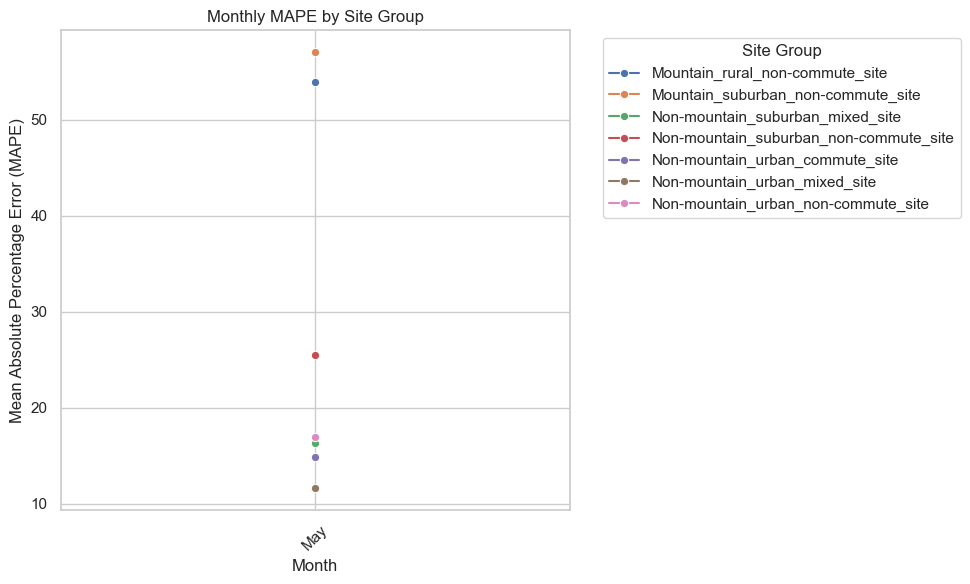

In [198]:
# metrics_df['month'].dtype == 'object' checks if months are stored as strings.
# pd.Categorical(..., ordered=True): Converts the column into an ordered categorical variable using your custom month_order.


if metrics_df['month'].dtype == 'object':
    month_order = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
                   'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
    metrics_df['month'] = pd.Categorical(metrics_df['month'], categories=month_order, ordered=True)

# ---- Step 2: Plot ----
plt.figure(figsize=(10, 6))
sns.lineplot(data=metrics_df, x='month', y='MAPE', hue='Site_Group', marker='o')
plt.title("Monthly MAPE by Site Group")
plt.ylabel("Mean Absolute Percentage Error (MAPE)")
plt.xlabel("Month")
plt.xticks(rotation=45)
# A legend is a box in a chart or graph that explains what each color, line, symbol, or pattern represents. orthat kon line ba graph ki nirdesh kore
# ekhane konai je box show kortese oita hoilo legend , ekhon eita kamon ki hobe oi samporke niche bola ache
plt.legend(title="Site Group", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [199]:
print(imputed_observed_AADT['month'].unique())

['May']


In [200]:
print(dowom_factor_avg['month'].unique())

['Apr' 'Aug' 'Dec' 'Feb' 'Jan' 'Jul' 'Jun' 'Mar' 'May' 'Nov' 'Oct' 'Sep']


In [201]:
imputed_aadt_ave = imputed_aadt.groupby(['id', 'site_name', 'Site_Group', 'year', 'month', 'week_of_year']).agg(Imputed_AADT=('Imputed_AADT', 'mean')).reset_index()

In [202]:
# Merge holdout_AADT with imputed_aadt directly to retain month
imputed_observed_AADT = pd.merge(holdout_AADT, imputed_aadt, on=['id', 'site_name', 'Site_Group', 'year'], how='left')
# Ensure Imputed_AADT is calculated at the desired level (e.g., daily or weekly average)
imputed_observed_AADT = imputed_observed_AADT.groupby(['id', 'site_name', 'Site_Group', 'year', 'month']).agg({
    'Observed_AADT': 'first',  # Keep the yearly Observed_AADT
    'Imputed_AADT': 'mean'    # Average Imputed_AADT by month
}).reset_index()

In [203]:
print(imputed_observed_AADT['month'].unique())

['May']


In [204]:
dowom_count_test = holdout_longterm_hourly_bike_clean_data_with_group.groupby(['id', 'site_name', 'Site_Group',
                                                                              'year', 'month', 'Day', 'Date', 'week_of_year'])['counts'].sum().reset_index()
print(dowom_count_test['month'].unique())

['April' 'August' 'December' 'February' 'January' 'July' 'June' 'March'
 'May' 'November' 'October' 'September']


In [205]:
imputed_aadt = pd.merge(dowom_count_test, dowom_factor_avg, on=['Site_Group', 'year', 'month', 'Day'], how='left')
imputed_aadt['DOWOMIF'] = imputed_aadt['DOWOMIF'].fillna(1.0)
imputed_aadt['Imputed_AADT'] = imputed_aadt['counts'] / imputed_aadt['DOWOMIF']
print(imputed_aadt['month'].unique())

['April' 'August' 'December' 'February' 'January' 'July' 'June' 'March'
 'May' 'November' 'October' 'September']


In [206]:
imputed_aadt_ave = imputed_aadt.groupby(['id', 'site_name', 'Site_Group', 'year', 'month', 'week_of_year']).agg(Imputed_AADT=('Imputed_AADT', 'mean')).reset_index()
print(imputed_aadt_ave['month'].unique())

['April' 'August' 'December' 'February' 'January' 'July' 'June' 'March'
 'May' 'November' 'October' 'September']


In [207]:
imputed_observed_AADT = pd.merge(holdout_AADT, imputed_aadt_ave, on=['id', 'site_name', 'Site_Group', 'year'], how='left')
print(imputed_observed_AADT['month'].unique())

['April' 'August' 'December' 'February' 'January' 'July' 'June' 'March'
 'May' 'November' 'October' 'September']


In [208]:
# Aggregate hourly counts to daily totals
dowom_count_test = holdout_longterm_hourly_bike_clean_data_with_group.groupby(['id', 'site_name', 'Site_Group',
                                                                              'year', 'month', 'Day', 'Date', 'week_of_year'])['counts'].sum().reset_index()

# Merge with DOWOMIF using left join
imputed_aadt = pd.merge(dowom_count_test, dowom_factor_avg, on=['Site_Group', 'year', 'month', 'Day'], how='left')
imputed_aadt['DOWOMIF'] = imputed_aadt['DOWOMIF'].fillna(1.0)  # Adjust fill value as needed
imputed_aadt['Imputed_AADT'] = imputed_aadt['counts'] / imputed_aadt['DOWOMIF']

# Merge with holdout_AADT to create imputed_observed_AADT with monthly data
imputed_observed_AADT = pd.merge(holdout_AADT, imputed_aadt, on=['id', 'site_name', 'Site_Group', 'year'], how='left')
# Aggregate to monthly level
imputed_observed_AADT = imputed_observed_AADT.groupby(['id', 'site_name', 'Site_Group', 'year', 'month']).agg({
    'Observed_AADT': 'first',  # Keep the yearly Observed_AADT
    'Imputed_AADT': 'mean'    # Average Imputed_AADT by month
}).reset_index()

# Verify the result
print("imputed_observed_AADT months:", imputed_observed_AADT['month'].unique())

imputed_observed_AADT months: ['April' 'August' 'December' 'February' 'January' 'July' 'June' 'March'
 'May' 'November' 'October' 'September']


C:\Users\Soumyadip Maitra\.conda\envs\geo_env\Lib\site-packages\sklearn\metrics\_regression.py:1283: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
C:\Users\Soumyadip Maitra\.conda\envs\geo_env\Lib\site-packages\sklearn\metrics\_regression.py:1283: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
C:\Users\Soumyadip Maitra\.conda\envs\geo_env\Lib\site-packages\sklearn\metrics\_regression.py:1283: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
C:\Users\Soumyadip Maitra\.conda\envs\geo_env\Lib\site-packages\sklearn\metrics\_regression.py:1283: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
C:\Users\Soumyadip Maitra\.conda\envs\geo_env\Lib\site-packages\sklearn\metrics\_regress

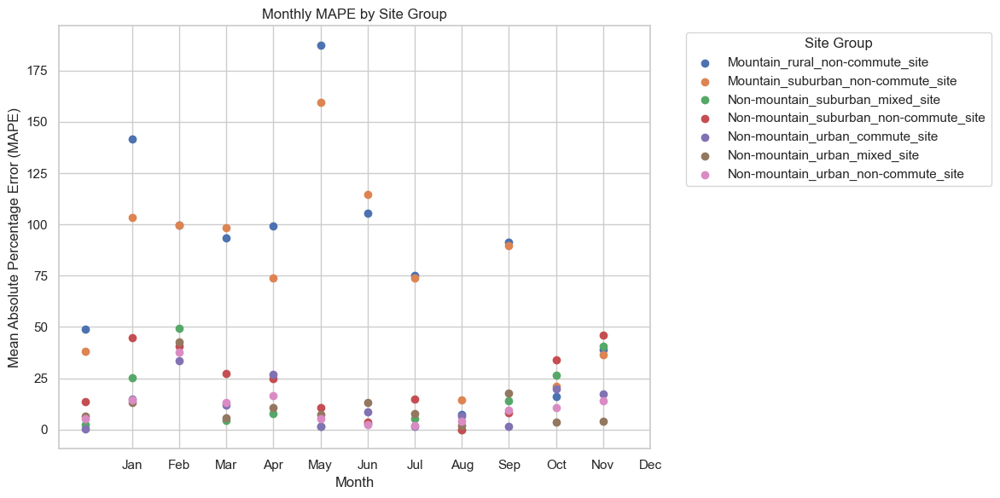

In [209]:
# Compute metrics for each group
metrics_df = imputed_observed_AADT.groupby(['Site_Group', 'year', 'month']).apply(compute_metrics).reset_index()

# Plot
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))
for site_group in metrics_df['Site_Group'].unique():
    subset = metrics_df[metrics_df['Site_Group'] == site_group]
    plt.scatter(subset['month'], subset['MAPE'], label=site_group)
plt.xlabel('Month')
plt.ylabel('Mean Absolute Percentage Error (MAPE)')
plt.title('Monthly MAPE by Site Group')
plt.legend(title='Site Group', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.tight_layout()
plt.show()

C:\Users\Soumyadip Maitra\.conda\envs\geo_env\Lib\site-packages\sklearn\metrics\_regression.py:1283: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
C:\Users\Soumyadip Maitra\.conda\envs\geo_env\Lib\site-packages\sklearn\metrics\_regression.py:1283: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
C:\Users\Soumyadip Maitra\.conda\envs\geo_env\Lib\site-packages\sklearn\metrics\_regression.py:1283: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
C:\Users\Soumyadip Maitra\.conda\envs\geo_env\Lib\site-packages\sklearn\metrics\_regression.py:1283: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
C:\Users\Soumyadip Maitra\.conda\envs\geo_env\Lib\site-packages\sklearn\metrics\_regress

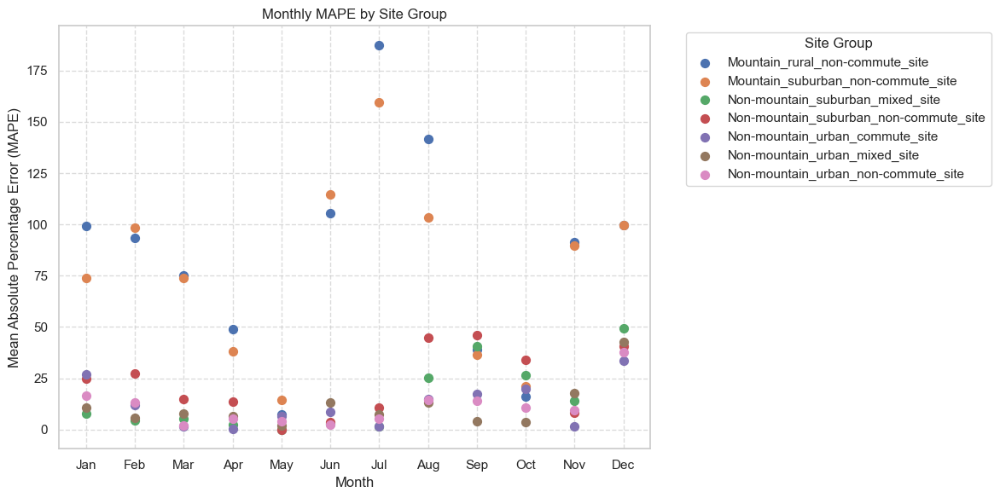

In [210]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming metrics_df is already created from imputed_observed_AADT
metrics_df = imputed_observed_AADT.groupby(['Site_Group', 'year', 'month']).apply(compute_metrics).reset_index()

# Convert month to numeric if it's text (e.g., 'May' to 5)
if metrics_df['month'].dtype == 'object':  # If months are strings like 'May'
    month_map = {'January': 1, 'February': 2, 'March': 3, 'April': 4, 'May': 5, 'June': 6,
                 'July': 7, 'August': 8, 'September': 9, 'October': 10, 'November': 11, 'December': 12}
    metrics_df['month_num'] = metrics_df['month'].map(lambda x: month_map.get(x, x) if isinstance(x, str) else x)
else:
    metrics_df['month_num'] = metrics_df['month']  # Use existing numeric month

# Create the plot
plt.figure(figsize=(12, 6))
for site_group in metrics_df['Site_Group'].unique():
    subset = metrics_df[metrics_df['Site_Group'] == site_group]
    plt.scatter(subset['month_num'], subset['MAPE'], label=site_group, s=50)  # s=50 for larger markers

plt.xlabel('Month')
plt.ylabel('Mean Absolute Percentage Error (MAPE)')
plt.title('Monthly MAPE by Site Group')
plt.legend(title='Site Group', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(True, linestyle='--', alpha=0.7)  # Add grid for better readability
plt.tight_layout()
plt.show()

In [211]:
from IPython.display import display

# Assuming metrics_df is already created from imputed_observed_AADT
metrics_df = imputed_observed_AADT.groupby(['Site_Group', 'year', 'month']).apply(compute_metrics).reset_index()

# 0) Safety checks
if 'metrics_df' not in globals():
    raise NameError("metrics_df not found in the notebook. Run the cell that creates metrics_df first.")
if 'data_for_factor_development' not in globals():
    print("Warning: data_for_factor_development not found; Train counts may be unavailable.")
if 'holdout_data_for_test' not in globals():
    raise NameError("holdout_data_for_test not found; can't compute Test counts. Ensure the holdout selection cell has been run.")

# 1) Identify a location identifier column to count unique locations
possible_id_cols = ['id', 'site_name']
id_col = None
for c in possible_id_cols:
    if c in (data_for_factor_development.columns if 'data_for_factor_development' in globals() else []) or \
       c in (holdout_data_for_test.columns if 'holdout_data_for_test' in globals() else []):
        id_col = c
        break
if id_col is None:
    print("Could not find a simple location id column; will count unique 'site_name' if present, otherwise rows.")
    if 'site_name' in (holdout_data_for_test.columns if 'holdout_data_for_test' in globals() else []):
        id_col = 'site_name'
    else:
        id_col = None

# 2) Compute aggregated RMSE & MAPE stats per Site_Group
metrics_summary = (
    metrics_df
    .groupby('Site_Group')
    .agg(
        RMSE_min = ('RMSE', 'min'),
        RMSE_max = ('RMSE', 'max'),
        RMSE_mean = ('RMSE', 'mean'),
        MAPE_min = ('MAPE', 'min'),
        MAPE_max = ('MAPE', 'max'),
        MAPE_mean = ('MAPE', 'mean')
    )
    .reset_index()
)

# 3) Compute Train counts per Site_Group
if id_col is not None and 'data_for_factor_development' in globals():
    train_counts = data_for_factor_development.groupby('Site_Group')[id_col].nunique().rename('Train_N')
elif 'data_for_factor_development' in globals():
    train_counts = data_for_factor_development.groupby('Site_Group').size().rename('Train_N')
else:
    train_counts = pd.Series(dtype=int, name='Train_N')

# Merge train counts
metrics_summary = metrics_summary.merge(train_counts, on='Site_Group', how='left')
metrics_summary['Train_N'] = metrics_summary['Train_N'].fillna(0).astype(int)

# 🚨 NEW STEP: Remove Site_Groups with Train_N = 0
metrics_summary = metrics_summary[metrics_summary['Train_N'] > 0]

# 4) Apply your Test_N rule: if Train_N <= 15 → 1, else → 10% of Train_N
def compute_testN(train_N):
    if train_N <= 15:
        return 1
    else:
        return max(1, int(round(train_N * 0.10)))

metrics_summary['Adjusted_Test_N'] = metrics_summary['Train_N'].apply(compute_testN)

# Build Site_Group_Label
metrics_summary['Site_Group_Label'] = metrics_summary.apply(
    lambda r: f"{r['Site_Group']} (Train N={r['Train_N']}, Test N={r['Adjusted_Test_N']})",
    axis=1
)

# 5) Round the numeric stats for neat display
metrics_summary[['RMSE_min','RMSE_max','RMSE_mean','MAPE_min','MAPE_max','MAPE_mean']] = (
    metrics_summary[['RMSE_min','RMSE_max','RMSE_mean','MAPE_min','MAPE_max','MAPE_mean']].round(2)
)

# 6) Reorder & rename columns to match your screenshot headings
final_table = metrics_summary[[
    'Site_Group_Label',
    'RMSE_min','RMSE_max','RMSE_mean',
    'MAPE_min','MAPE_max','MAPE_mean'
]].rename(columns={
    'RMSE_min':'Test RMSE (Min)',
    'RMSE_max':'Test RMSE (Max)',
    'RMSE_mean':'Test RMSE (Mean)',
    'MAPE_min':'Test MAPE (Min)',
    'MAPE_max':'Test MAPE (Max)',
    'MAPE_mean':'Test MAPE (Mean)'
})

# 7) Overall row (totals for Train/Test counts and overall means for RMSE/MAPE)
if id_col is not None and 'data_for_factor_development' in globals():
    overall_train = data_for_factor_development[id_col].nunique()
elif 'data_for_factor_development' in globals():
    overall_train = len(data_for_factor_development)
else:
    overall_train = metrics_summary['Train_N'].sum()

overall_test = metrics_summary['Adjusted_Test_N'].sum()  # use adjusted Test_N

overall_rmse_mean = metrics_df['RMSE'].mean()
overall_mape_mean = metrics_df['MAPE'].mean()

overall_row = {
    'Site_Group_Label': f"Overall (Train={int(overall_train)}, Test={int(overall_test)})",
    'Test RMSE (Min)': '',
    'Test RMSE (Max)': '',
    'Test RMSE (Mean)': round(overall_rmse_mean,2) if not np.isnan(overall_rmse_mean) else np.nan,
    'Test MAPE (Min)': '',
    'Test MAPE (Max)': '',
    'Test MAPE (Mean)': round(overall_mape_mean,2) if not np.isnan(overall_mape_mean) else np.nan
}

final_table = pd.concat([final_table, pd.DataFrame([overall_row])], ignore_index=True)

# 8) Display and save
pd.set_option('display.max_colwidth', None)  # Show full text in columns
pd.set_option('display.expand_frame_repr', False)  # Prevent line wrapping

display(final_table)
final_table

# Save to CSV
final_table.to_csv('metrics_summary_by_site_group.csv', index=False)
print("Saved metrics_summary_by_site_group.csv")










C:\Users\Soumyadip Maitra\.conda\envs\geo_env\Lib\site-packages\sklearn\metrics\_regression.py:1283: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
C:\Users\Soumyadip Maitra\.conda\envs\geo_env\Lib\site-packages\sklearn\metrics\_regression.py:1283: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
C:\Users\Soumyadip Maitra\.conda\envs\geo_env\Lib\site-packages\sklearn\metrics\_regression.py:1283: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
C:\Users\Soumyadip Maitra\.conda\envs\geo_env\Lib\site-packages\sklearn\metrics\_regression.py:1283: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
C:\Users\Soumyadip Maitra\.conda\envs\geo_env\Lib\site-packages\sklearn\metrics\_regress

,Site_Group_Label,Test RMSE (Min),Test RMSE (Max),Test RMSE (Mean),Test MAPE (Min),Test MAPE (Max),Test MAPE (Mean)
0,"Mountain_rural_non-commute_site (Train N=3, Test N=1)",9.07,224.9,100.42,7.56,187.42,83.69
1,"Mountain_suburban_non-commute_site (Train N=2, Test N=1)",1.85,20.74,10.00,14.25,159.55,76.93
2,"Non-mountain_urban_commute_site (Train N=17, Test N=2)",0.27,52.45,18.84,0.17,33.41,12.00
3,"Non-mountain_urban_mixed_site (Train N=16, Test N=2)",9.41,222.77,58.58,1.8,42.68,11.22
4,"Non-mountain_urban_non-commute_site (Train N=44, Test N=4)",2.61,45.94,13.72,2.14,37.65,11.25
5,"Overall (Train=82, Test=10)",,,30.71,,,33.21


Saved metrics_summary_by_site_group.csv


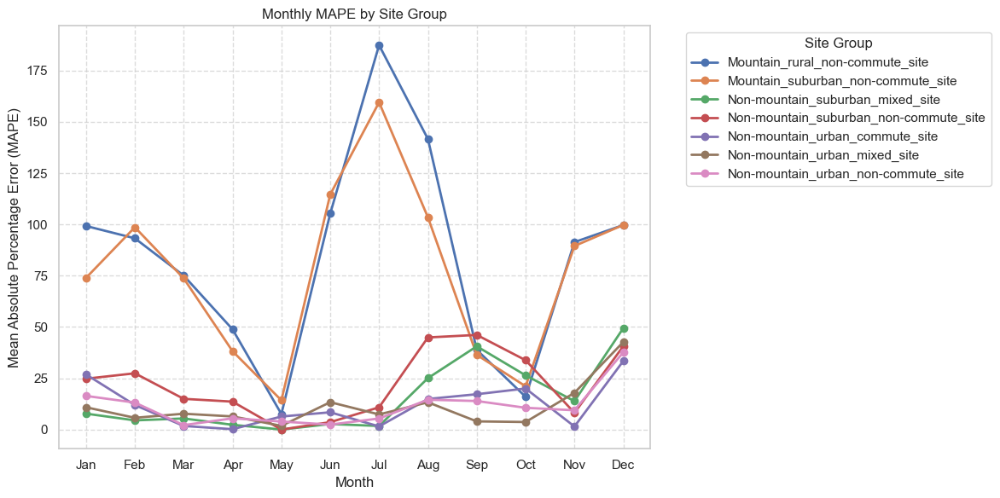

In [212]:
# Convert month to numeric if it's text (e.g., 'May' to 5)
if metrics_df['month'].dtype == 'object':  # If months are strings like 'May'
    month_map = {'January': 1, 'February': 2, 'March': 3, 'April': 4, 'May': 5, 'June': 6,
                 'July': 7, 'August': 8, 'September': 9, 'October': 10, 'November': 11, 'December': 12}
    metrics_df['month_num'] = metrics_df['month'].map(lambda x: month_map.get(x, x) if isinstance(x, str) else x)
else:
    metrics_df['month_num'] = metrics_df['month']  # Use existing numeric month

# Create the line plot
plt.figure(figsize=(12, 6))
for site_group in metrics_df['Site_Group'].unique():
    subset = metrics_df[metrics_df['Site_Group'] == site_group].sort_values('month_num')
    plt.plot(subset['month_num'], subset['MAPE'], marker='o', label=site_group, linewidth=2)

plt.xlabel('Month')
plt.ylabel('Mean Absolute Percentage Error (MAPE)')
plt.title('Monthly MAPE by Site Group')
plt.legend(title='Site Group', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(True, linestyle='--', alpha=0.7)  # Add grid for readability
plt.tight_layout()
plt.show()

C:\Users\Soumyadip Maitra\.conda\envs\geo_env\Lib\site-packages\sklearn\metrics\_regression.py:1283: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
C:\Users\Soumyadip Maitra\.conda\envs\geo_env\Lib\site-packages\sklearn\metrics\_regression.py:1283: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
C:\Users\Soumyadip Maitra\.conda\envs\geo_env\Lib\site-packages\sklearn\metrics\_regression.py:1283: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
C:\Users\Soumyadip Maitra\.conda\envs\geo_env\Lib\site-packages\sklearn\metrics\_regression.py:1283: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
C:\Users\Soumyadip Maitra\.conda\envs\geo_env\Lib\site-packages\sklearn\metrics\_regress

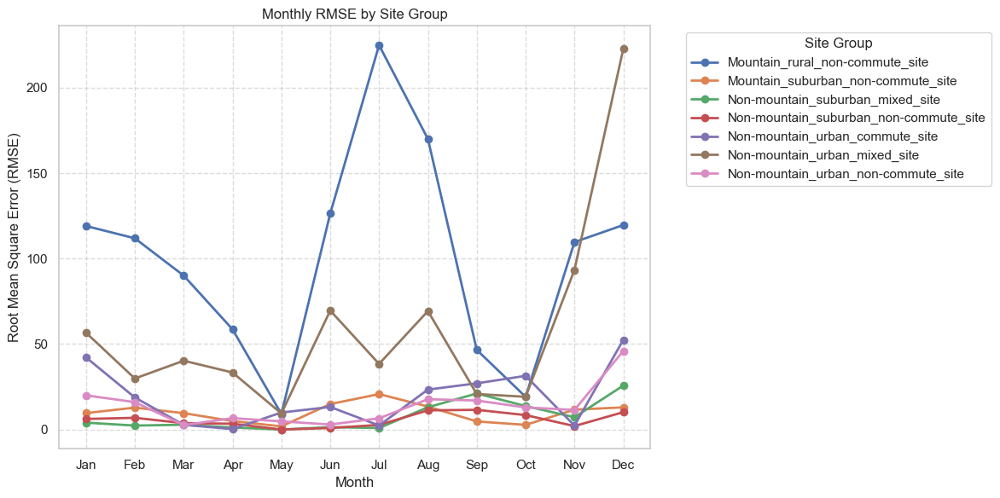

In [213]:

# Assuming metrics_df is already created from imputed_observed_AADT
metrics_df = imputed_observed_AADT.groupby(['Site_Group', 'year', 'month']).apply(compute_metrics).reset_index()

# Convert month to numeric if it's text (e.g., 'May' to 5)
if metrics_df['month'].dtype == 'object':  # If months are strings like 'May'
    month_map = {'January': 1, 'February': 2, 'March': 3, 'April': 4, 'May': 5, 'June': 6,
                 'July': 7, 'August': 8, 'September': 9, 'October': 10, 'November': 11, 'December': 12}
    metrics_df['month_num'] = metrics_df['month'].map(lambda x: month_map.get(x, x) if isinstance(x, str) else x)
else:
    metrics_df['month_num'] = metrics_df['month']  # Use existing numeric month

# Create the line plot
plt.figure(figsize=(12, 6))
for site_group in metrics_df['Site_Group'].unique():
    subset = metrics_df[metrics_df['Site_Group'] == site_group].sort_values('month_num')
    plt.plot(subset['month_num'], subset['RMSE'], marker='o', label=site_group, linewidth=2)

plt.xlabel('Month')
plt.ylabel('Root Mean Square Error (RMSE)')
plt.title('Monthly RMSE by Site Group')
plt.legend(title='Site Group', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(True, linestyle='--', alpha=0.7)  # Add grid for readability
plt.tight_layout()
plt.show()

In [214]:
imputed_observed_AADT1=pd.merge(holdout_AADT,imputed_aadt, on=['id','site_name','Site_Group','year'],how='inner')
imputed_observed_AADT1

,id,site_name,Site_Group,year,wt_count,days_Ct,Observed_AADT,month,Day,Date,week_of_year,counts,DOWOMIF,num_sites,Imputed_AADT
0,101005215,(07) 7th Ave. Between Lawton & Kirkham - SB,Non-mountain_urban_non-commute_site,2022,1066697.0,8759,122,April,Friday,2022-04-01,13,137.0,1.0,NaN,137.0
1,101005215,(07) 7th Ave. Between Lawton & Kirkham - SB,Non-mountain_urban_non-commute_site,2022,1066697.0,8759,122,April,Friday,2022-04-08,14,144.0,1.0,NaN,144.0
2,101005215,(07) 7th Ave. Between Lawton & Kirkham - SB,Non-mountain_urban_non-commute_site,2022,1066697.0,8759,122,April,Friday,2022-04-15,15,149.0,1.0,NaN,149.0
3,101005215,(07) 7th Ave. Between Lawton & Kirkham - SB,Non-mountain_urban_non-commute_site,2022,1066697.0,8759,122,April,Friday,2022-04-22,16,145.0,1.0,NaN,145.0
4,101005215,(07) 7th Ave. Between Lawton & Kirkham - SB,Non-mountain_urban_non-commute_site,2022,1066697.0,8759,122,April,Friday,2022-04-29,17,123.0,1.0,NaN,123.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2550,104041347,Foster Avenue,Non-mountain_suburban_non-commute_site,2022,217495.6,8759,25,September,Tuesday,2022-09-27,39,39.0,1.0,NaN,39.0
2551,104041347,Foster Avenue,Non-mountain_suburban_non-commute_site,2022,217495.6,8759,25,September,Wednesday,2022-09-07,36,35.0,1.0,NaN,35.0
2552,104041347,Foster Avenue,Non-mountain_suburban_non-commute_site,2022,217495.6,8759,25,September,Wednesday,2022-09-14,37,32.0,1.0,NaN,32.0
2553,104041347,Foster Avenue,Non-mountain_suburban_non-commute_site,2022,217495.6,8759,25,September,Wednesday,2022-09-21,38,45.0,1.0,NaN,45.0


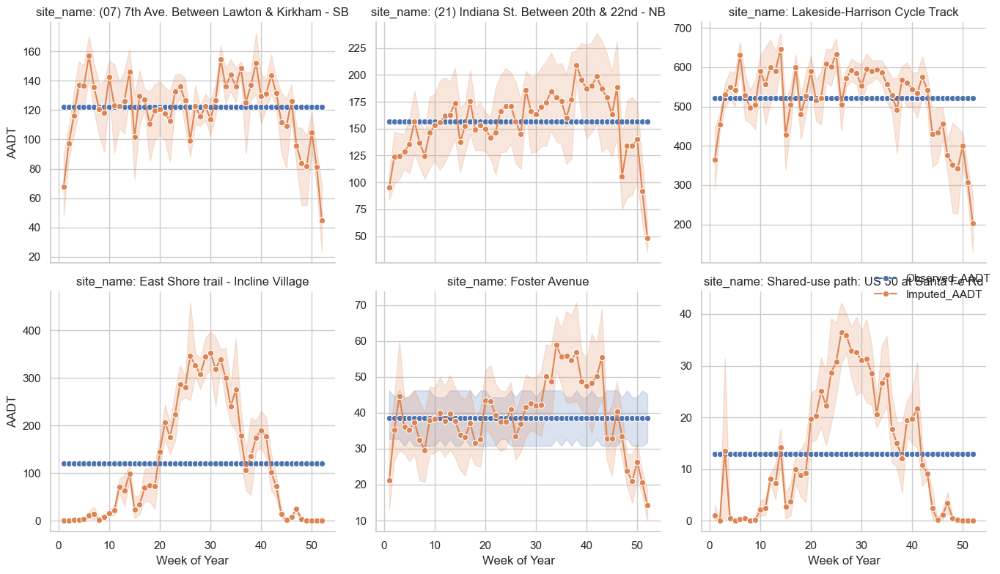

In [215]:
# Melt the DataFrame to long format for Seaborn
# melt() transforms the DataFrame from wide format to long format, which Seaborn prefers for plotting.
# id_vars: Columns to keep unchanged — here: Intersection, year, week_of_year
# value_vars: The columns to unpivot — here: Observed_AADT and Imputed_AADT
# Result: a new column called 'Type' with values 'Observed_AADT' and 'Imputed_AADT', and a column 'AADT' with the actual numeric values.
df_long = imputed_observed_AADT1.melt(
    id_vars=['site_name', 'year','week_of_year'],
    value_vars=['Observed_AADT', 'Imputed_AADT'],
    var_name='Type',
    value_name='AADT'
)

# Set plot style
# Sets a clean white background with grid lines for better readability.
sns.set(style="whitegrid")

# Create FacetGrid with one subplot per Loc_id
# col_wrap=3 bolte bojahai proti row te 3 ta chobi thakbe
# sharey=False  This tells Seaborn: “Let each subplot have its own Y-axis scale.”
# If one intersection has AADT values ranging from 500 to 2000, and another has values from 50 to 300, they’ll each use their own Y-axis range.
g = sns.FacetGrid(df_long, col="site_name", col_wrap=3, height=4, sharey=False)

# Map lineplot onto each subplot
g.map_dataframe(sns.lineplot, x="week_of_year", y="AADT", hue="Type", marker="o")

# Improve legend and axis labels
g.add_legend()
g.set_axis_labels("Week of Year", "AADT")
g.set_titles("site_name: {col_name}")
plt.tight_layout()
plt.show()

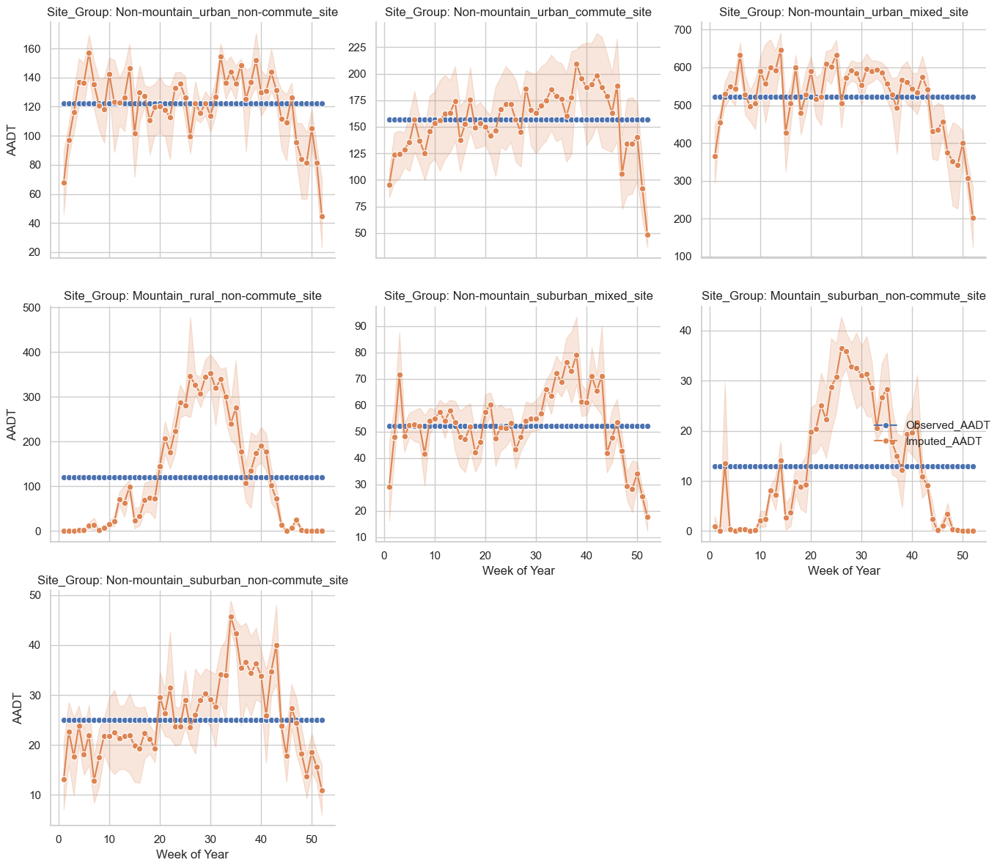

In [216]:
# Melt the DataFrame to long format for Seaborn
df_long = imputed_observed_AADT1.melt(
    id_vars=['Site_Group','year', 'week_of_year'],
    value_vars=['Observed_AADT', 'Imputed_AADT'],
    var_name='Type',
    value_name='AADT'
)

# Set plot style
sns.set(style="whitegrid")

# Create FacetGrid with one subplot per Loc_id
# col_wrap=3 bolte bojahai proti row te 3 ta chobi thakbe
g = sns.FacetGrid(df_long, col='Site_Group', col_wrap=3, height=4, sharey=False)

# Map lineplot onto each subplot
g.map_dataframe(sns.lineplot, x="week_of_year", y="AADT", hue="Type", marker="o")

# Improve legend and axis labels
g.add_legend()
g.set_axis_labels("Week of Year", "AADT")
g.set_titles("Site_Group: {col_name}")
plt.tight_layout()
plt.show()